In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from math import ceil
from pmdarima import auto_arima
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from lightgbm import LGBMRegressor
from sklearn.feature_selection import mutual_info_regression
from hyperopt import hp
from hyperopt.pyll.base import scope
import mlflow
from copy import deepcopy
import altair as alt
alt.data_transformers.enable("vegafusion")
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX

from timeseries_rolling_window import RollingWindowNaive, RollingWindowSarimax, RollingWindowSklearn, RollingWindowLightGBM, RollingWindowLinearGam
from plotting_functions import statsmodel_fit_summary, PlotLightGBMTrainingPredictions, plot_predictions_interactive, plot_cumulative_absolute_error
from bayesian_optimisation import BayesianOptimisationLgbm

pd.set_option('display.max_rows', 500)

mlflow.login()

# Databricks Host (should begin with https://): https://community.cloud.databricks.com/

mlflow.set_tracking_uri("databricks")

alt.renderers.enable('default')

2024/07/22 12:46:19 INFO mlflow.utils.credentials: Successfully connected to MLflow hosted tracking server! Host: https://community.cloud.databricks.com.


RendererRegistry.enable('default')

In [2]:
df = pd.read_csv("..\\data\\prepped_data_NL.csv").iloc[:-1].copy()
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.sort_values('datetime')

target_name = "day_ahead_prices_lead_48"

gap_days = 7
n_days = len(df) // 24
test_days = validation_days = ceil(n_days * 0.2)
training_days = n_days - test_days - validation_days - gap_days

df_train_0 = df.iloc[:int((training_days + validation_days) * 24)].copy()
df_test = df.iloc[int((training_days + validation_days + gap_days) * 24):].copy()

training_days_initial = len(df_train_0) // 24
df_train = df_train_0.iloc[:(training_days * 24)].copy()
df_val = df_train_0.iloc[(training_days * 24):].copy()

In [3]:
print(f'Training set {df_train["datetime"].dt.date.min()} to {df_train["datetime"].dt.date.max()}')
print(f'Validation set {df_val["datetime"].dt.date.min()} to {df_val["datetime"].dt.date.max()}')
print(f'Test set {df_test["datetime"].dt.date.min()} to {df_test["datetime"].dt.date.max()}')

Training set 2020-01-06 to 2022-07-07
Validation set 2022-07-08 to 2023-05-11
Test set 2023-05-19 to 2024-03-21


# Model Fitting

## Naive

In [4]:
validation_days = len(df_val) // 24
startdate_val = df_val["datetime"].dt.date.min()
y_val = df_val[target_name].values
horizon_days_val = validation_days

test_days = validation_days
startdate_test = startdate_val
y_test = np.array([])
horizon_days_test = horizon_days_val
covariate_names = []

gap_days = 0

dict_models = {
    'naive': {
        'training_days':[training_days],
        'scale_data':False,
        'model_implementation':'sklearn',
        'model_params':{
            'lookback_horizon_days':[2,7]
        },
        'fit_params':{}
    }
}

save_predictions_flag = {
    'train':True,
    'val':True,
    'test':False
}

mlflow.set_experiment("/electricity-prices-hyperparameteropt")

rwn = RollingWindowNaive(df, y_val, startdate_val, validation_days, horizon_days_val, y_test, startdate_test,
                         test_days, horizon_days_test, gap_days,target_name, covariate_names)

predictions_naive, results_naive =  rwn.train_models(dict_models, save_predictions_flag)

Loading predictions from ..\predictions\predictions_train_naive_lookback_horizon_days_2_train_914d_train_period_2020-01-08_2022-07-07.npy
Loading predictions from ..\predictions\predictions_val_naive_lookback_horizon_days_2_train_914d_val_period_2022-07-08_2023-05-11.npy
Loading predictions from ..\predictions\predictions_train_naive_lookback_horizon_days_7_train_914d_train_period_2020-01-13_2022-07-07.npy
Loading predictions from ..\predictions\predictions_val_naive_lookback_horizon_days_7_train_914d_val_period_2022-07-08_2023-05-11.npy


## ARIMA

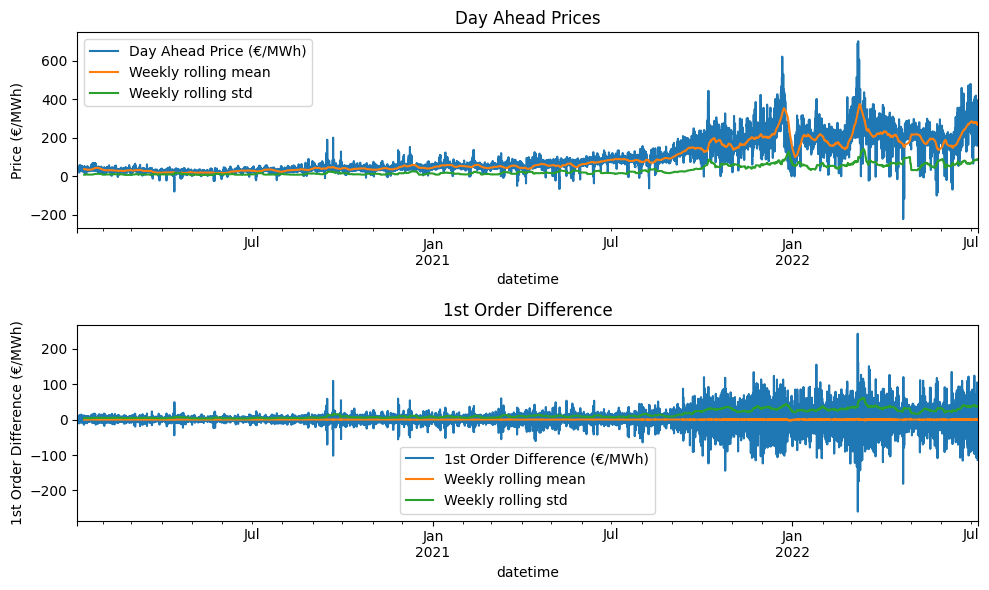

In [5]:
target_name_arima = 'day_ahead_prices'


# Plot the hourly day ahead electricity price, along with the weekly rolling mean

fig, axs = plt.subplots(2, 1, figsize=(10, 6))

df_train.set_index('datetime')[target_name_arima].plot(ax=axs[0],
                                                                title='Day Ahead Prices',
                                                                label='Day Ahead Price (€/MWh)',
                                                                ylabel='Price (€/MWh)')
df_train.set_index('datetime')[target_name_arima].rolling(24*7).mean().plot(ax=axs[0], label='Weekly rolling mean')
df_train.set_index('datetime')[target_name_arima].rolling(24*7).std().plot(ax=axs[0],label='Weekly rolling std')
axs[0].legend()

df_train.set_index('datetime')[target_name_arima].diff().plot(ax=axs[1],
                                                               title='1st Order Difference',
                                                               label='1st Order Difference (€/MWh)',
                                                        ylabel='1st Order Difference (€/MWh)')
df_train.set_index('datetime')[target_name_arima].diff().rolling(24*7).mean().plot(ax=axs[1], label='Weekly rolling mean')
df_train.set_index('datetime')[target_name_arima].diff().rolling(24*7).std().plot(ax=axs[1],label='Weekly rolling std')
axs[1].legend()

plt.tight_layout()
plt.show()

In [6]:
df_train[target_name_arima + "_first_diff"] = df_train[target_name].diff()

features = [target_name_arima, target_name_arima + "_first_diff"]

df_adfuller = [] 

for feature in features:

    temp_d = {}
    result = adfuller(df_train[feature].dropna().values)
    temp_d['Series Name'] = feature
    temp_d['ADF Statistic'] = result[0]
    temp_d['p-value'] = result[1]
    if temp_d['p-value'] <= 0.05:
        temp_d['Comment'] = "Reject H0, Data is stationary"
    elif temp_d['p-value'] > 0.05:
        temp_d['Comment'] = "Fail to reject H0, Data is non-stationary"
    
    df_adfuller.append(temp_d)

df_adfuller = pd.DataFrame(df_adfuller)
df_adfuller

,Series Name,ADF Statistic,p-value,Comment
0,day_ahead_prices,-3.368592,0.012077,"Reject H0, Data is stationary"
1,day_ahead_prices_first_diff,-27.769725,0.000000,"Reject H0, Data is stationary"


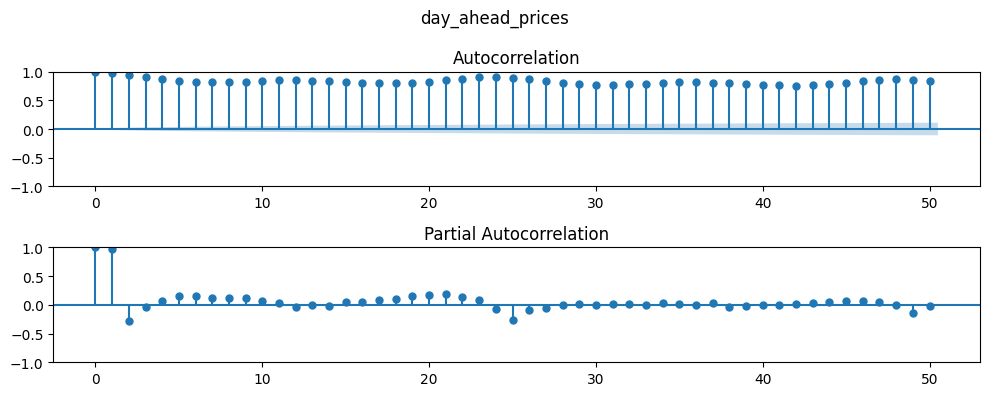

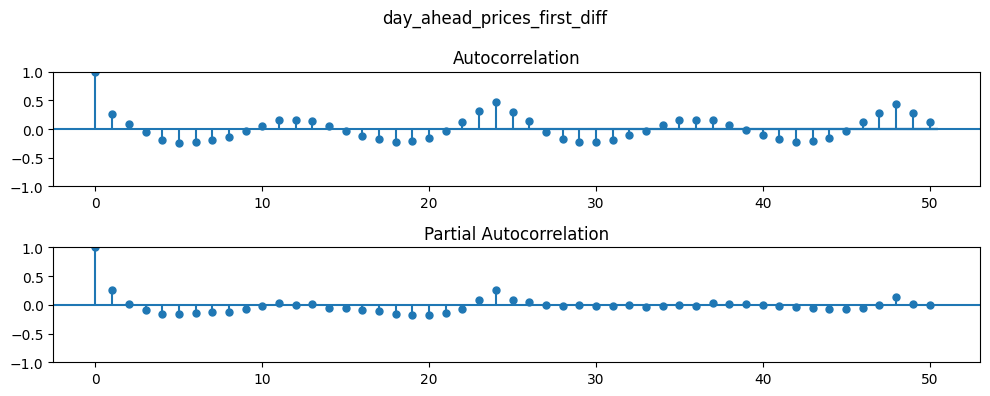

In [7]:
# Plot autocorrelation and partial autocorrelation plots

for feature in [target_name_arima, target_name_arima + "_first_diff"]:
    fig, axs = plt.subplots(2, 1, figsize=(10, 4))
    plot_acf(df_train[feature].dropna(), lags=50, ax=axs[0])
    plot_pacf(df_train[feature].dropna(), lags=50, ax=axs[1])
    fig.suptitle(feature)
    plt.tight_layout()
    plt.show()
    
df_train = df_train.drop(target_name_arima + "_first_diff", axis=1)

Although we reject the null hypothesis of the Augmentented Dicky Fuller test, the plot of the time series does not look fully stationary so I will take the first difference.

The significant spike at lag 1 in the PACF plot above suggests a AR(1) and the significant spike at 24 suggests a seasonal AR(1) component.

The significant spike at lag 1 in the ACF plot above suggests a MA(1) and the significant spike at 24 suggests a seasonal MA(1) component.

This suggests a SARIMAX(1, 1, 1)x(1, 0, 1, 24) model. I will also fit the auto_arima to this time series to confirm these parameter selections

In [8]:
# Fit auto_arima function
data = df_train.set_index('datetime')[target_name_arima].iloc[-200:]
stepwise_fit = auto_arima(data, max_p = 3, max_q = 3, m = 24, stepwise = True)     

In [9]:
# To print the summary 
stepwise_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  200
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 24)   Log Likelihood                -945.745
Date:                            Wed, 03 Jul 2024   AIC                           1903.489
Time:                                    10:47:22   BIC                           1923.279
Sample:                                06-29-2022   HQIC                          1911.498
                                     - 07-07-2022                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      2.1438      1.686      1.271      0.204      -1.161       5.449
ar.L1          0.8638      0.039     22.157      0.000       0.787       0.940
ma.L1          0.2601      0.077      3.371      0.001       0.109       0.411
ar.S.L24       0.9415      0.038     24.537      0.000       0.866       1.017
ma.S.L24      -0.6571      0.110     -5.960      0.000      -0.873      -0.441
sigma2       676.4265     63.295     10.687      0.000     552.370     800.483
===================================================================================
Ljung-Box (L1) (Q):                   0.13   Jarque-Bera (JB):                30.90
Prob(Q):                              0.71   Prob(JB):                         0.00
Heteroskedasticity (H):               0.79   Skew:                            -0.04
Prob(H) (two-sided):                  0.34   Kurtosis:                         4.92
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Due to the time requried to fit the auto_arima funtion, I just fit it to the last 200 observations in the training set. The best model fit using auto_arima was SARIMAX(1, 0, 1)x(1, 0, 1, 24). I will fit both models and compare their performance on the validation set.

####################
####################
Fitting SARIMAX(1, 1, 1)x(1, 0, 1, 24)

                                     SARIMAX Results                                      
Dep. Variable:                   day_ahead_prices   No. Observations:                21936
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 24)   Log Likelihood              -89730.440
Date:                            Sun, 21 Jul 2024   AIC                         179470.881
Time:                                    20:55:05   BIC                         179510.860
Sample:                                01-06-2020   HQIC                        179483.903
                                     - 07-07-2022                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8809      0.003

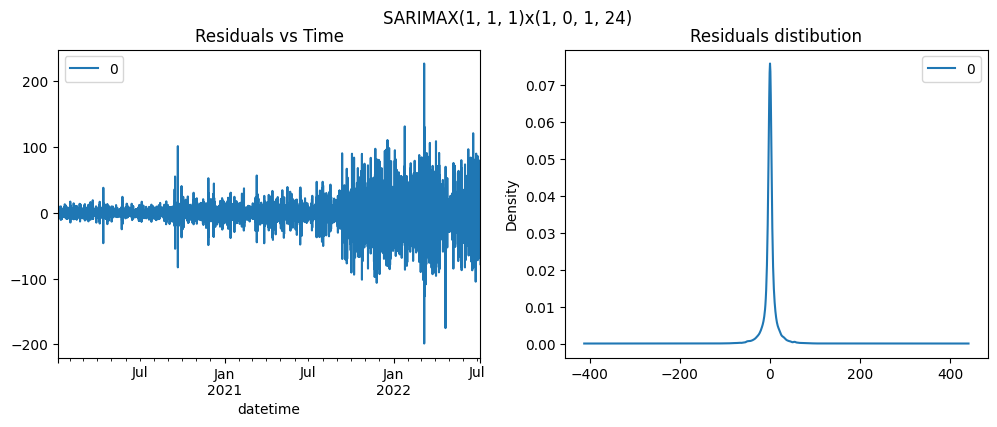

####################
####################
####################
####################
Fitting SARIMAX(1, 0, 2)x(1, 0, 1, 24)

                                      SARIMAX Results                                       
Dep. Variable:                     day_ahead_prices   No. Observations:                21936
Model:             SARIMAX(1, 0, 2)x(1, 0, [1], 24)   Log Likelihood              -89787.140
Date:                              Sun, 21 Jul 2024   AIC                         179586.279
Time:                                      20:55:48   BIC                         179634.254
Sample:                                  01-06-2020   HQIC                        179601.905
                                       - 07-07-2022                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------

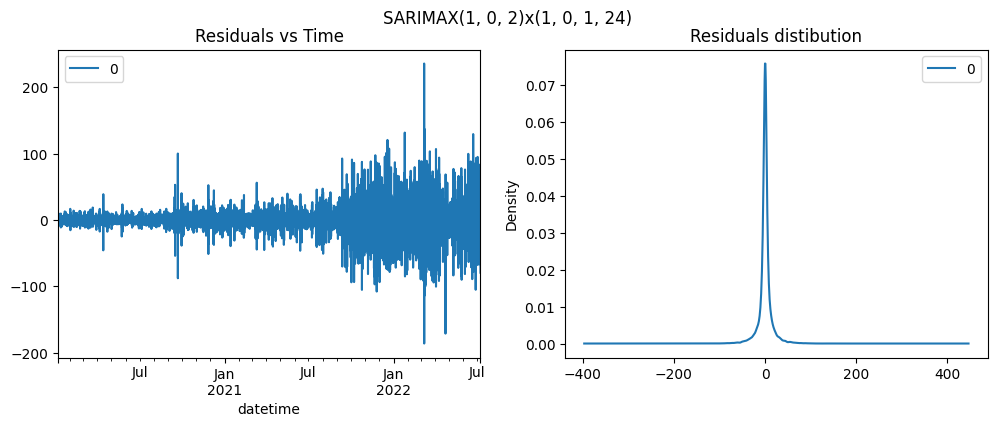

####################
####################


In [8]:
data = df_train.set_index('datetime')[target_name_arima]
data.index.freq = 'h'

# SARIMAX(1, 1, 1)x(1, 0, 1, 24)
model_SARIMAX1 = SARIMAX(data, order=(1,1,1), seasonal_order=(1, 0, 1, 24)).fit()
statsmodel_fit_summary(model_SARIMAX1, "SARIMAX(1, 1, 1)x(1, 0, 1, 24)")

# SARIMAX(1, 0, 1)x(1, 0, 1, 24)
model_SARIMAX1 = SARIMAX(data, order=(1,0,2), seasonal_order=(1, 0, 1, 24)).fit()
statsmodel_fit_summary(model_SARIMAX1, "SARIMAX(1, 0, 2)x(1, 0, 1, 24)")

AIC is minimised by SARIMAX(1, 1, 1)x(1, 0, 1, 24)

I will choose between these three models and the number of training days based on their validation performance

In [9]:
validation_days = len(df_val) // 24
startdate_val = df_val["datetime"].dt.date.min()
y_val = df_val[target_name].values
horizon_days_val = 1

test_days = validation_days
startdate_test = startdate_val
y_test = np.array([])
horizon_days_test = horizon_days_val
covariate_names = []

gap_days = 0

covariate_names = None
binary_covariate_names = None
categorical_covariate_names = None
target_name_arima = 'day_ahead_prices'

dict_models = {
    'SARIMAX': {
        'training_days':[300],
        'lead_days':2,
        'scale_data':False,
        'generate_dummy_features':False,
        'model_implementation':'statsmodels',
        'model_params':{
            'order':[(1, 1, 1)],
            'seasonal_order':[(1, 0, 1, 24)]
        },
        'fit_params':{}
    }
}

save_predictions_flag = {
    'train':True,
    'val':True,
    'test':False
}

mlflow.set_experiment("/electricity-prices-sarimax-hyperparameteropt")

rws = RollingWindowSarimax(df, y_val, startdate_val, validation_days, horizon_days_val, y_test, startdate_test,
                            test_days, horizon_days_test, gap_days, target_name_arima, covariate_names,
                            binary_covariate_names, categorical_covariate_names)

_, _ = rws.train_models(dict_models, save_predictions_flag)

Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-07-08_2022-07-08.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-07-09_2022-07-09.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-07-10_2022-07-10.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-07-11_2022-07-11.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-07-12_2022-07-12.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-07-13_2022-07-13.npy
Loading predictions from ..\predictions\predictions_val_SA

Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-09-09_2022-09-09.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-09-10_2022-09-10.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-09-11_2022-09-11.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-09-12_2022-09-12.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-09-13_2022-09-13.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-09-14_2022-09-14.npy
Loading predictions from ..\predictions\predictions_val_SA

Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-11-03_2022-11-03.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-11-04_2022-11-04.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-11-05_2022-11-05.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-11-06_2022-11-06.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-11-07_2022-11-07.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-11-08_2022-11-08.npy
Loading predictions from ..\predictions\predictions_val_SA

Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-12-30_2022-12-30.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2022-12-31_2022-12-31.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-01-01_2023-01-01.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-01-02_2023-01-02.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-01-03_2023-01-03.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-01-04_2023-01-04.npy
Loading predictions from ..\predictions\predictions_val_SA

Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-02-25_2023-02-25.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-02-26_2023-02-26.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-02-27_2023-02-27.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-02-28_2023-02-28.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-03-01_2023-03-01.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-03-02_2023-03-02.npy
Loading predictions from ..\predictions\predictions_val_SA

Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-04-26_2023-04-26.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-04-27_2023-04-27.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-04-28_2023-04-28.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-04-29_2023-04-29.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-04-30_2023-04-30.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_300d_val_period_2023-05-01_2023-05-01.npy
Loading predictions from ..\predictions\predictions_val_SA

SARIMAX(1, 1, 1)x(1, 0, 1, 24) trained for 200 training days produced the best validation performance

In [10]:
dict_models = {
    'SARIMAX': {
        'training_days':[200],
        'lead_days':2,
        'scale_data':False,
        'generate_dummy_features':False,
        'model_implementation':'statsmodels',
        'model_params':{
            'order':[(1, 1, 1)],
            'seasonal_order':[(1, 0, 1, 24)]
        },
        'fit_params':{}
    }
}

save_predictions_flag = {
    'train':True,
    'val':True,
    'test':False
}

mlflow.set_experiment("/electricity-prices-hyperparameteropt")
predictions_arima, results_arima = rws.train_models(dict_models, save_predictions_flag)

Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-07-08_2022-07-08.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-07-09_2022-07-09.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-07-10_2022-07-10.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-07-11_2022-07-11.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-07-12_2022-07-12.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-07-13_2022-07-13.npy
Loading predictions from ..\predictions\predictions_val_SA

Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-09-09_2022-09-09.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-09-10_2022-09-10.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-09-11_2022-09-11.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-09-12_2022-09-12.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-09-13_2022-09-13.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-09-14_2022-09-14.npy
Loading predictions from ..\predictions\predictions_val_SA

Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-11-08_2022-11-08.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-11-09_2022-11-09.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-11-10_2022-11-10.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-11-11_2022-11-11.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-11-12_2022-11-12.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2022-11-13_2022-11-13.npy
Loading predictions from ..\predictions\predictions_val_SA

Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2023-01-08_2023-01-08.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2023-01-09_2023-01-09.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2023-01-10_2023-01-10.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2023-01-11_2023-01-11.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2023-01-12_2023-01-12.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2023-01-13_2023-01-13.npy
Loading predictions from ..\predictions\predictions_val_SA

Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2023-03-14_2023-03-14.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2023-03-15_2023-03-15.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2023-03-16_2023-03-16.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2023-03-17_2023-03-17.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2023-03-18_2023-03-18.npy
Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2023-03-19_2023-03-19.npy
Loading predictions from ..\predictions\predictions_val_SA

Loading predictions from ..\predictions\predictions_val_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_val_period_2023-05-11_2023-05-11.npy


## Linear Models

In [12]:
covariate_names = [col for col in df_train.columns]

for names in ['datetime', target_name]:
    covariate_names.remove(names)
    
binary_covariate_names = [
    'target_weekend',
    'target_is_holiday',
    'target_holiday_Eerste Kerstdag',
    'target_holiday_Eerste Pinksterdag',
    'target_holiday_Eerste paasdag',
    'target_holiday_Hemelvaartsdag',
    'target_holiday_Nieuwjaarsdag',
    'target_holiday_Tweede Kerstdag',
    'target_holiday_Tweede paasdag',
    'target_holiday_Tweede Pinksterdag',
]

categorical_covariate_names = [
    'target_hour_of_day',
    'target_day_of_week',
    'target_month'
]

save_predictions_flag = {
    'train':True,
    'val':True,
    'test':False
}

validation_days = len(df_val) // 24
startdate_val = df_val["datetime"].dt.date.min()
y_val = df_val[target_name].values
horizon_days_val = 1

test_days = validation_days
startdate_test = startdate_val
y_test = np.array([])
horizon_days_test = horizon_days_val

rwsklm = RollingWindowSklearn(df, y_val, startdate_val, validation_days, horizon_days_val, y_test, startdate_test,
                              test_days, horizon_days_test, gap_days, target_name, covariate_names,
                              binary_covariate_names, categorical_covariate_names)

I will tune the hyperparamters for these models using the validation set

### Lasso

In [13]:
dict_models = {
    'lasso': {
        'training_days':[100],
        'scale_data':True,
        'generate_dummy_features':True,
        'model_implementation':'sklearn',
        'model_instance': Lasso(random_state=0),
        'model_params':{
            'alpha':[0.01]
        },
        'fit_params':{}
    }
}


mlflow.set_experiment("/electricity-prices-lasso-hyperparameteropt")
_, _ = rwsklm.train_models(dict_models, save_predictions_flag)

Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-03-30_2022-07-07.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-03-30_2022-07-07.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-03-30_2022-07-07.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-03-30_2022-07-07.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2022-07-08_2022-07-08.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-03-31_2022-07-08.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-03-31_2022-07-08.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-03-31_2022-07-08.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-03-31_2022-

Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-04-15_2022-07-23.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-04-15_2022-07-23.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-04-15_2022-07-23.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-04-15_2022-07-23.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2022-07-24_2022-07-24.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-04-16_2022-07-24.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-04-16_2022-07-24.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-04-16_2022-07-24.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-04-16_2022-

Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-05-02_2022-08-09.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-05-02_2022-08-09.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-05-02_2022-08-09.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-05-02_2022-08-09.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2022-08-10_2022-08-10.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-05-03_2022-08-10.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-05-03_2022-08-10.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-05-03_2022-08-10.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-05-03_2022-

Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-05-17_2022-08-24.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-05-17_2022-08-24.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-05-17_2022-08-24.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-05-17_2022-08-24.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2022-08-25_2022-08-25.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-05-18_2022-08-25.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-05-18_2022-08-25.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-05-18_2022-08-25.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-05-18_2022-

Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-06-02_2022-09-09.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-06-02_2022-09-09.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-06-02_2022-09-09.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-06-02_2022-09-09.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2022-09-10_2022-09-10.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-06-03_2022-09-10.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-06-03_2022-09-10.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-06-03_2022-09-10.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-06-03_2022-

Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-06-17_2022-09-24.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-06-17_2022-09-24.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-06-17_2022-09-24.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-06-17_2022-09-24.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2022-09-25_2022-09-25.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-06-18_2022-09-25.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-06-18_2022-09-25.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-06-18_2022-09-25.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-06-18_2022-

Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-07-02_2022-10-09.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-07-02_2022-10-09.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-07-02_2022-10-09.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-07-02_2022-10-09.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2022-10-10_2022-10-10.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-07-03_2022-10-10.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-07-03_2022-10-10.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-07-03_2022-10-10.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-07-03_2022-

Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-07-17_2022-10-24.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-07-17_2022-10-24.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-07-17_2022-10-24.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-07-17_2022-10-24.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2022-10-25_2022-10-25.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-07-18_2022-10-25.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-07-18_2022-10-25.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-07-18_2022-10-25.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-07-18_2022-

Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-08-03_2022-11-10.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-08-03_2022-11-10.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-08-03_2022-11-10.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-08-03_2022-11-10.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2022-11-11_2022-11-11.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-08-04_2022-11-11.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-08-04_2022-11-11.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-08-04_2022-11-11.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-08-04_2022-

Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-08-19_2022-11-26.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-08-19_2022-11-26.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-08-19_2022-11-26.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-08-19_2022-11-26.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2022-11-27_2022-11-27.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-08-20_2022-11-27.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-08-20_2022-11-27.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-08-20_2022-11-27.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-08-20_2022-

Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-09-04_2022-12-12.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-09-04_2022-12-12.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-09-04_2022-12-12.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-09-04_2022-12-12.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2022-12-13_2022-12-13.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-09-05_2022-12-13.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-09-05_2022-12-13.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-09-05_2022-12-13.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-09-05_2022-

Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-09-19_2022-12-27.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-09-19_2022-12-27.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-09-19_2022-12-27.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-09-19_2022-12-27.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2022-12-28_2022-12-28.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-09-20_2022-12-28.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-09-20_2022-12-28.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-09-20_2022-12-28.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-09-20_2022-

Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-10-04_2023-01-11.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-10-04_2023-01-11.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-10-04_2023-01-11.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-10-04_2023-01-11.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2023-01-12_2023-01-12.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-10-05_2023-01-12.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-10-05_2023-01-12.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-10-05_2023-01-12.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-10-05_2023-

Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-10-19_2023-01-26.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-10-19_2023-01-26.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-10-19_2023-01-26.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-10-19_2023-01-26.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2023-01-27_2023-01-27.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-10-20_2023-01-27.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-10-20_2023-01-27.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-10-20_2023-01-27.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-10-20_2023-

Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-11-03_2023-02-10.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-11-03_2023-02-10.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2023-02-11_2023-02-11.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-11-04_2023-02-11.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-11-04_2023-02-11.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-11-04_2023-02-11.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-11-04_2023-02-11.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2023-02-12_2023-02-12.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-11-05_2023-02-12.joblib
L

Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-11-19_2023-02-26.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-11-19_2023-02-26.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-11-19_2023-02-26.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-11-19_2023-02-26.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2023-02-27_2023-02-27.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-11-20_2023-02-27.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-11-20_2023-02-27.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-11-20_2023-02-27.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-11-20_2023-

Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-12-05_2023-03-14.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-12-05_2023-03-14.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2023-03-15_2023-03-15.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-12-06_2023-03-15.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-12-06_2023-03-15.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-12-06_2023-03-15.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-12-06_2023-03-15.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2023-03-16_2023-03-16.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-12-07_2023-03-16.joblib
L

Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-12-22_2023-03-31.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-12-22_2023-03-31.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2023-04-01_2023-04-01.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-12-23_2023-04-01.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-12-23_2023-04-01.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2022-12-23_2023-04-01.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-12-23_2023-04-01.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2023-04-02_2023-04-02.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2022-12-24_2023-04-02.joblib
L

Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2023-01-07_2023-04-16.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2023-01-07_2023-04-16.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2023-01-07_2023-04-16.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2023-04-17_2023-04-17.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2023-01-08_2023-04-17.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2023-01-08_2023-04-17.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2023-01-08_2023-04-17.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2023-01-08_2023-04-17.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2023-04-18_2023-04-18.np

Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2023-01-23_2023-05-02.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2023-01-23_2023-05-02.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2023-01-23_2023-05-02.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2023-05-03_2023-05-03.npy
Saving model cache to ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2023-01-24_2023-05-03.joblib
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2023-01-24_2023-05-03.joblib
Saving ..\predictions\predictions_train_lasso_alpha_0.01_train_100d_train_period_2023-01-24_2023-05-03.npy
Loading model cache from ..\models\model_cache_lasso_alpha_0.01_train_100d_train_period_2023-01-24_2023-05-03.joblib
Saving ..\predictions\predictions_val_lasso_alpha_0.01_train_100d_val_period_2023-05-04_2023-05-04.np

The best validation performance with the least overfitting is achieved using 200 days of training data and alpha = 0.1

### Ridge

In [14]:
dict_models = {
    'ridge': {
        'training_days':[200],
        'scale_data':True,
        'generate_dummy_features':True,
        'model_implementation':'sklearn',
        'model_instance': Ridge(random_state=0),
        'model_params':{
            'alpha':[5000.0]
        },
        'fit_params':{}
    }
}

mlflow.set_experiment("/electricity-prices-ridge-hyperparameteropt")
_, _ = rwsklm.train_models(dict_models, save_predictions_flag)

Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2021-12-20_2022-07-07.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-07-08_2022-07-08.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2021-12-21_2022-07-08.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-07-09_2022-07-09.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2021-12-22_2022-07-09.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-07-10_2022-07-10.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2021-12-23_2022-07-10.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-07-11_2022-07-11.npy


Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-01-23_2022-08-10.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-08-11_2022-08-11.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-01-24_2022-08-11.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-08-12_2022-08-12.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-01-25_2022-08-12.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-08-13_2022-08-13.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-01-26_2022-08-13.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-08-14_2022-08-14.npy


Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-02-28_2022-09-15.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-09-16_2022-09-16.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-03-01_2022-09-16.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-09-17_2022-09-17.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-03-02_2022-09-17.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-09-18_2022-09-18.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-03-03_2022-09-18.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-09-19_2022-09-19.npy


Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-10-21_2022-10-21.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-04-05_2022-10-21.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-10-22_2022-10-22.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-04-06_2022-10-22.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-10-23_2022-10-23.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-04-07_2022-10-23.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-10-24_2022-10-24.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-04-08_2022-10-24.npy


Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-11-26_2022-11-26.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-05-11_2022-11-26.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-11-27_2022-11-27.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-05-12_2022-11-27.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-11-28_2022-11-28.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-05-13_2022-11-28.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-11-29_2022-11-29.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-05-14_2022-11-29.npy


Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-06-13_2022-12-29.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-12-30_2022-12-30.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-06-14_2022-12-30.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-12-31_2022-12-31.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-06-15_2022-12-31.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-01-01_2023-01-01.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-06-16_2023-01-01.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-01-02_2023-01-02.npy


Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-07-16_2023-01-31.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-02-01_2023-02-01.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-07-17_2023-02-01.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-02-02_2023-02-02.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-07-18_2023-02-02.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-02-03_2023-02-03.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-07-19_2023-02-03.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-02-04_2023-02-04.npy


Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-03-23_2023-03-23.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-09-05_2023-03-23.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-03-24_2023-03-24.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-09-06_2023-03-24.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-03-25_2023-03-25.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-09-07_2023-03-25.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-03-26_2023-03-26.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-09-08_2023-03-26.npy


Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-10-10_2023-04-27.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-04-28_2023-04-28.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-10-11_2023-04-28.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-04-29_2023-04-29.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-10-12_2023-04-29.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-04-30_2023-04-30.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-10-13_2023-04-30.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-05-01_2023-05-01.npy


The best validation performance with the least overfitting is achieved using 200 days of training data and alpha = 5000.0

### Elastic Net

In [15]:
dict_models = {
    'elasticnet': {
        'training_days':[100],
        'scale_data':True,
        'generate_dummy_features':True,
        'model_implementation':'sklearn',
        'model_instance': ElasticNet(random_state=0),
        'model_params':{
            'alpha':[0.3],
            'l1_ratio':[0.1, 0.2, 0.3, 0.4, 0.6, 0.7, 0.8, 0.9]
        },
        'fit_params':{}
    }
}

mlflow.set_experiment("/electricity-prices-elasticnet-hyperparameteropt")
_, _ = rwsklm.train_models(dict_models, save_predictions_flag)

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-03-30_2022-07-07.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-03-30_2022-07-07.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-03-30_2022-07-07.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-03-30_2022-07-07.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2022-07-08_2022-07-08.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-03-31_2022-07-08.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-03-31_2022-07-08.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-04-15_2022-07-23.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-04-15_2022-07-23.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-04-15_2022-07-23.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-04-15_2022-07-23.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2022-07-24_2022-07-24.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-04-16_2022-07-24.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-04-16_2022-07-24.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-04-30_2022-08-07.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-04-30_2022-08-07.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-04-30_2022-08-07.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2022-08-08_2022-08-08.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-05-01_2022-08-08.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-05-01_2022-08-08.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-05-01_2022-08-08.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-05-13_2022-08-20.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-05-13_2022-08-20.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-05-13_2022-08-20.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-05-13_2022-08-20.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2022-08-21_2022-08-21.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-05-14_2022-08-21.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-05-14_2022-08-21.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-05-27_2022-09-03.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-05-27_2022-09-03.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-05-27_2022-09-03.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2022-09-04_2022-09-04.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-05-28_2022-09-04.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-05-28_2022-09-04.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-05-28_2022-09-04.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-06-11_2022-09-18.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-06-11_2022-09-18.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-06-11_2022-09-18.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-06-11_2022-09-18.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2022-09-19_2022-09-19.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-06-12_2022-09-19.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-06-12_2022-09-19.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-06-24_2022-10-01.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-06-24_2022-10-01.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-06-24_2022-10-01.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2022-10-02_2022-10-02.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-06-25_2022-10-02.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-06-25_2022-10-02.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-06-25_2022-10-02.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-07-08_2022-10-15.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-07-08_2022-10-15.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-07-08_2022-10-15.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2022-10-16_2022-10-16.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-07-09_2022-10-16.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-07-09_2022-10-16.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-07-09_2022-10-16.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-07-22_2022-10-29.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-07-22_2022-10-29.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-07-22_2022-10-29.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-07-22_2022-10-29.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2022-10-30_2022-10-30.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-07-23_2022-10-30.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-07-23_2022-10-30.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-08-04_2022-11-11.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-08-04_2022-11-11.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-08-04_2022-11-11.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2022-11-12_2022-11-12.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-08-05_2022-11-12.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-08-05_2022-11-12.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-08-05_2022-11-12.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-08-17_2022-11-24.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-08-17_2022-11-24.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-08-17_2022-11-24.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2022-11-25_2022-11-25.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-08-18_2022-11-25.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-08-18_2022-11-25.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-08-18_2022-11-25.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-01_2022-12-09.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-01_2022-12-09.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-01_2022-12-09.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-01_2022-12-09.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2022-12-10_2022-12-10.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-02_2022-12-10.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-02_2022-12-10.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-15_2022-12-23.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-15_2022-12-23.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-15_2022-12-23.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-15_2022-12-23.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2022-12-24_2022-12-24.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-16_2022-12-24.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-16_2022-12-24.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-28_2023-01-05.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-28_2023-01-05.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-28_2023-01-05.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-28_2023-01-05.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2023-01-06_2023-01-06.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-29_2023-01-06.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-09-29_2023-01-06.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-10-11_2023-01-18.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-10-11_2023-01-18.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-10-11_2023-01-18.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-10-11_2023-01-18.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2023-01-19_2023-01-19.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-10-12_2023-01-19.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-10-12_2023-01-19.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-10-26_2023-02-02.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-10-26_2023-02-02.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-10-26_2023-02-02.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-10-26_2023-02-02.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2023-02-03_2023-02-03.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-10-27_2023-02-03.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-10-27_2023-02-03.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-11-09_2023-02-16.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-11-09_2023-02-16.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-11-09_2023-02-16.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-11-09_2023-02-16.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2023-02-17_2023-02-17.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-11-10_2023-02-17.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-11-10_2023-02-17.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-11-24_2023-03-03.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-11-24_2023-03-03.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-11-24_2023-03-03.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2023-03-04_2023-03-04.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-11-25_2023-03-04.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-11-25_2023-03-04.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-11-25_2023-03-04.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-12-08_2023-03-17.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-12-08_2023-03-17.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-12-08_2023-03-17.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-12-08_2023-03-17.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2023-03-18_2023-03-18.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-12-09_2023-03-18.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-12-09_2023-03-18.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-12-22_2023-03-31.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-12-22_2023-03-31.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-12-22_2023-03-31.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-12-22_2023-03-31.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2023-04-01_2023-04-01.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-12-23_2023-04-01.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2022-12-23_2023-04-01.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2023-01-04_2023-04-13.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2023-01-04_2023-04-13.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2023-01-04_2023-04-13.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2023-01-04_2023-04-13.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2023-04-14_2023-04-14.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2023-01-05_2023-04-14.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2023-01-05_2023-04-14.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2023-01-18_2023-04-27.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2023-01-18_2023-04-27.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2023-01-18_2023-04-27.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2023-01-18_2023-04-27.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_val_period_2023-04-28_2023-04-28.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2023-01-19_2023-04-28.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_period_2023-01-19_2023-04-28.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.1_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-03-30_2022-07-07.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-03-30_2022-07-07.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-03-30_2022-07-07.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-03-30_2022-07-07.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2022-07-08_2022-07-08.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-03-31_2022-07-08.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-03-31_2022-07-08.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-04-13_2022-07-21.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2022-07-22_2022-07-22.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-04-14_2022-07-22.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-04-14_2022-07-22.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-04-14_2022-07-22.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-04-14_2022-07-22.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2022-07-23_2022-07-23.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-04-29_2022-08-06.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-04-29_2022-08-06.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-04-29_2022-08-06.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-04-29_2022-08-06.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2022-08-07_2022-08-07.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-04-30_2022-08-07.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-04-30_2022-08-07.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-05-14_2022-08-21.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-05-14_2022-08-21.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-05-14_2022-08-21.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-05-14_2022-08-21.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2022-08-22_2022-08-22.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-05-15_2022-08-22.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-05-15_2022-08-22.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-05-29_2022-09-05.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-05-29_2022-09-05.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-05-29_2022-09-05.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-05-29_2022-09-05.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2022-09-06_2022-09-06.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-05-30_2022-09-06.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-05-30_2022-09-06.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-06-13_2022-09-20.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-06-13_2022-09-20.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-06-13_2022-09-20.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-06-13_2022-09-20.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2022-09-21_2022-09-21.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-06-14_2022-09-21.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-06-14_2022-09-21.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-06-28_2022-10-05.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-06-28_2022-10-05.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-06-28_2022-10-05.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-06-28_2022-10-05.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2022-10-06_2022-10-06.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-06-29_2022-10-06.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-06-29_2022-10-06.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-07-13_2022-10-20.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-07-13_2022-10-20.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2022-10-21_2022-10-21.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-07-14_2022-10-21.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-07-14_2022-10-21.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-07-14_2022-10-21.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-07-14_2022-10-21.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2022-

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-07-26_2022-11-02.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2022-11-03_2022-11-03.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-07-27_2022-11-03.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-07-27_2022-11-03.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-07-27_2022-11-03.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-07-27_2022-11-03.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2022-11-04_2022-11-04.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-08-09_2022-11-16.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-08-09_2022-11-16.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-08-09_2022-11-16.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2022-11-17_2022-11-17.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-08-10_2022-11-17.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-08-10_2022-11-17.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-08-10_2022-11-17.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-08-24_2022-12-01.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-08-24_2022-12-01.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-08-24_2022-12-01.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-08-24_2022-12-01.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2022-12-02_2022-12-02.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-08-25_2022-12-02.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-08-25_2022-12-02.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-09-08_2022-12-16.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-09-08_2022-12-16.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-09-08_2022-12-16.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-09-08_2022-12-16.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2022-12-17_2022-12-17.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-09-09_2022-12-17.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-09-09_2022-12-17.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-09-23_2022-12-31.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-09-23_2022-12-31.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-09-23_2022-12-31.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-09-23_2022-12-31.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2023-01-01_2023-01-01.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-09-24_2023-01-01.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-09-24_2023-01-01.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-10-08_2023-01-15.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-10-08_2023-01-15.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-10-08_2023-01-15.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-10-08_2023-01-15.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2023-01-16_2023-01-16.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-10-09_2023-01-16.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-10-09_2023-01-16.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-10-22_2023-01-29.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-10-22_2023-01-29.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-10-22_2023-01-29.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-10-22_2023-01-29.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2023-01-30_2023-01-30.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-10-23_2023-01-30.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-10-23_2023-01-30.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-11-05_2023-02-12.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-11-05_2023-02-12.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-11-05_2023-02-12.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-11-05_2023-02-12.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2023-02-13_2023-02-13.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-11-06_2023-02-13.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-11-06_2023-02-13.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-11-20_2023-02-27.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-11-20_2023-02-27.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-11-20_2023-02-27.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-11-20_2023-02-27.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2023-02-28_2023-02-28.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-11-21_2023-02-28.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-11-21_2023-02-28.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-12-04_2023-03-13.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-12-04_2023-03-13.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-12-04_2023-03-13.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2023-03-14_2023-03-14.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-12-05_2023-03-14.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-12-05_2023-03-14.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-12-05_2023-03-14.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-12-20_2023-03-29.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-12-20_2023-03-29.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-12-20_2023-03-29.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-12-20_2023-03-29.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2023-03-30_2023-03-30.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-12-21_2023-03-30.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2022-12-21_2023-03-30.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2023-01-02_2023-04-11.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2023-01-02_2023-04-11.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2023-04-12_2023-04-12.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2023-01-03_2023-04-12.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2023-01-03_2023-04-12.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2023-01-03_2023-04-12.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2023-01-03_2023-04-12.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2023-

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2023-01-18_2023-04-27.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2023-01-18_2023-04-27.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2023-01-18_2023-04-27.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2023-01-18_2023-04-27.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_val_period_2023-04-28_2023-04-28.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2023-01-19_2023-04-28.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_period_2023-01-19_2023-04-28.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.2_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-03-30_2022-07-07.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-03-30_2022-07-07.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-03-30_2022-07-07.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-03-30_2022-07-07.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2022-07-08_2022-07-08.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-03-31_2022-07-08.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-03-31_2022-07-08.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-04-14_2022-07-22.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-04-14_2022-07-22.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-04-14_2022-07-22.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-04-14_2022-07-22.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2022-07-23_2022-07-23.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-04-15_2022-07-23.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-04-15_2022-07-23.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-04-28_2022-08-05.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-04-28_2022-08-05.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2022-08-06_2022-08-06.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-04-29_2022-08-06.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-04-29_2022-08-06.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-04-29_2022-08-06.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-04-29_2022-08-06.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2022-

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-05-13_2022-08-20.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-05-13_2022-08-20.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-05-13_2022-08-20.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2022-08-21_2022-08-21.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-05-14_2022-08-21.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-05-14_2022-08-21.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-05-14_2022-08-21.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-05-29_2022-09-05.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-05-29_2022-09-05.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-05-29_2022-09-05.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-05-29_2022-09-05.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2022-09-06_2022-09-06.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-05-30_2022-09-06.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-05-30_2022-09-06.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-06-13_2022-09-20.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-06-13_2022-09-20.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-06-13_2022-09-20.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-06-13_2022-09-20.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2022-09-21_2022-09-21.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-06-14_2022-09-21.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-06-14_2022-09-21.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2022-10-05_2022-10-05.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-06-28_2022-10-05.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-06-28_2022-10-05.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-06-28_2022-10-05.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-06-28_2022-10-05.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2022-10-06_2022-10-06.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-06-29_2022-10-06.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-07-12_2022-10-19.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-07-12_2022-10-19.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-07-12_2022-10-19.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-07-12_2022-10-19.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2022-10-20_2022-10-20.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-07-13_2022-10-20.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-07-13_2022-10-20.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-07-27_2022-11-03.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-07-27_2022-11-03.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-07-27_2022-11-03.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-07-27_2022-11-03.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2022-11-04_2022-11-04.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-07-28_2022-11-04.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-07-28_2022-11-04.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-08-11_2022-11-18.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-08-11_2022-11-18.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-08-11_2022-11-18.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-08-11_2022-11-18.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2022-11-19_2022-11-19.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-08-12_2022-11-19.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-08-12_2022-11-19.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-08-26_2022-12-03.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-08-26_2022-12-03.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-08-26_2022-12-03.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-08-26_2022-12-03.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2022-12-04_2022-12-04.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-08-27_2022-12-04.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-08-27_2022-12-04.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-09-09_2022-12-17.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-09-09_2022-12-17.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-09-09_2022-12-17.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-09-09_2022-12-17.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2022-12-18_2022-12-18.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-09-10_2022-12-18.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-09-10_2022-12-18.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-09-25_2023-01-02.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-09-25_2023-01-02.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-09-25_2023-01-02.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-09-25_2023-01-02.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2023-01-03_2023-01-03.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-09-26_2023-01-03.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-09-26_2023-01-03.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-10-10_2023-01-17.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-10-10_2023-01-17.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-10-10_2023-01-17.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2023-01-18_2023-01-18.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-10-11_2023-01-18.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-10-11_2023-01-18.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-10-11_2023-01-18.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-10-25_2023-02-01.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-10-25_2023-02-01.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-10-25_2023-02-01.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2023-02-02_2023-02-02.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-10-26_2023-02-02.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-10-26_2023-02-02.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-10-26_2023-02-02.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-11-09_2023-02-16.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-11-09_2023-02-16.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-11-09_2023-02-16.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-11-09_2023-02-16.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2023-02-17_2023-02-17.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-11-10_2023-02-17.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-11-10_2023-02-17.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-11-23_2023-03-02.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-11-23_2023-03-02.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-11-23_2023-03-02.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-11-23_2023-03-02.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2023-03-03_2023-03-03.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-11-24_2023-03-03.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-11-24_2023-03-03.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-12-09_2023-03-18.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-12-09_2023-03-18.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-12-09_2023-03-18.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-12-09_2023-03-18.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2023-03-19_2023-03-19.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-12-10_2023-03-19.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-12-10_2023-03-19.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-12-23_2023-04-01.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2023-04-02_2023-04-02.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-12-24_2023-04-02.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-12-24_2023-04-02.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-12-24_2023-04-02.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2022-12-24_2023-04-02.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2023-04-03_2023-04-03.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2023-01-07_2023-04-16.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2023-01-07_2023-04-16.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2023-01-07_2023-04-16.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2023-01-07_2023-04-16.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2023-04-17_2023-04-17.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2023-01-08_2023-04-17.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2023-01-08_2023-04-17.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_p

Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2023-01-22_2023-05-01.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2023-01-22_2023-05-01.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2023-05-02_2023-05-02.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2023-01-23_2023-05-02.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2023-01-23_2023-05-02.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2023-01-23_2023-05-02.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_train_period_2023-01-23_2023-05-02.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.3_train_100d_val_period_2023-

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-04-03_2022-07-11.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-04-03_2022-07-11.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-04-03_2022-07-11.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-04-03_2022-07-11.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2022-07-12_2022-07-12.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-04-04_2022-07-12.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-04-04_2022-07-12.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-04-16_2022-07-24.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-04-16_2022-07-24.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-04-16_2022-07-24.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-04-16_2022-07-24.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2022-07-25_2022-07-25.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-04-17_2022-07-25.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-04-17_2022-07-25.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-01_2022-08-08.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-01_2022-08-08.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-01_2022-08-08.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2022-08-09_2022-08-09.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-02_2022-08-09.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-02_2022-08-09.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-02_2022-08-09.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-15_2022-08-22.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-15_2022-08-22.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-15_2022-08-22.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-15_2022-08-22.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2022-08-23_2022-08-23.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-16_2022-08-23.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-16_2022-08-23.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-29_2022-09-05.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-29_2022-09-05.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-29_2022-09-05.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-29_2022-09-05.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2022-09-06_2022-09-06.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-30_2022-09-06.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-05-30_2022-09-06.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-06-13_2022-09-20.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-06-13_2022-09-20.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-06-13_2022-09-20.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-06-13_2022-09-20.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2022-09-21_2022-09-21.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-06-14_2022-09-21.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-06-14_2022-09-21.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-06-26_2022-10-03.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-06-26_2022-10-03.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-06-26_2022-10-03.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-06-26_2022-10-03.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2022-10-04_2022-10-04.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-06-27_2022-10-04.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-06-27_2022-10-04.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-07-11_2022-10-18.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-07-11_2022-10-18.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-07-11_2022-10-18.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-07-11_2022-10-18.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2022-10-19_2022-10-19.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-07-12_2022-10-19.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-07-12_2022-10-19.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-07-26_2022-11-02.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-07-26_2022-11-02.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2022-11-03_2022-11-03.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-07-27_2022-11-03.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-07-27_2022-11-03.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-07-27_2022-11-03.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-07-27_2022-11-03.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2022-

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-08-10_2022-11-17.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-08-10_2022-11-17.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-08-10_2022-11-17.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2022-11-18_2022-11-18.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-08-11_2022-11-18.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-08-11_2022-11-18.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-08-11_2022-11-18.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-08-24_2022-12-01.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-08-24_2022-12-01.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-08-24_2022-12-01.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-08-24_2022-12-01.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2022-12-02_2022-12-02.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-08-25_2022-12-02.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-08-25_2022-12-02.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-09-08_2022-12-16.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-09-08_2022-12-16.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-09-08_2022-12-16.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2022-12-17_2022-12-17.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-09-09_2022-12-17.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-09-09_2022-12-17.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-09-09_2022-12-17.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-09-23_2022-12-31.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-09-23_2022-12-31.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-09-23_2022-12-31.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-09-23_2022-12-31.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2023-01-01_2023-01-01.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-09-24_2023-01-01.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-09-24_2023-01-01.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-10-08_2023-01-15.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-10-08_2023-01-15.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-10-08_2023-01-15.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-10-08_2023-01-15.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2023-01-16_2023-01-16.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-10-09_2023-01-16.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-10-09_2023-01-16.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-10-21_2023-01-28.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-10-21_2023-01-28.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-10-21_2023-01-28.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-10-21_2023-01-28.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2023-01-29_2023-01-29.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-10-22_2023-01-29.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-10-22_2023-01-29.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-11-05_2023-02-12.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-11-05_2023-02-12.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-11-05_2023-02-12.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-11-05_2023-02-12.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2023-02-13_2023-02-13.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-11-06_2023-02-13.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-11-06_2023-02-13.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-11-20_2023-02-27.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-11-20_2023-02-27.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-11-20_2023-02-27.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-11-20_2023-02-27.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2023-02-28_2023-02-28.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-11-21_2023-02-28.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-11-21_2023-02-28.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-04_2023-03-13.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-04_2023-03-13.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-04_2023-03-13.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-04_2023-03-13.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2023-03-14_2023-03-14.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-05_2023-03-14.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-05_2023-03-14.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-17_2023-03-26.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-17_2023-03-26.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-17_2023-03-26.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-17_2023-03-26.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2023-03-27_2023-03-27.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-18_2023-03-27.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-18_2023-03-27.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-31_2023-04-09.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-31_2023-04-09.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-31_2023-04-09.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2022-12-31_2023-04-09.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2023-04-10_2023-04-10.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2023-01-01_2023-04-10.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2023-01-01_2023-04-10.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2023-01-13_2023-04-22.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2023-01-13_2023-04-22.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2023-01-13_2023-04-22.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2023-04-23_2023-04-23.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2023-01-14_2023-04-23.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2023-01-14_2023-04-23.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2023-01-14_2023-04-23.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2023-01-26_2023-05-05.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2023-01-26_2023-05-05.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2023-01-26_2023-05-05.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2023-01-26_2023-05-05.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_val_period_2023-05-06_2023-05-06.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2023-01-27_2023-05-06.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_period_2023-01-27_2023-05-06.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.4_train_100d_train_p

Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-04-08_2022-07-16.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-04-08_2022-07-16.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_val_period_2022-07-17_2022-07-17.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-04-09_2022-07-17.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-04-09_2022-07-17.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-04-09_2022-07-17.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-04-09_2022-07-17.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_val_period_2022-

Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-04-21_2022-07-29.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-04-21_2022-07-29.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-04-21_2022-07-29.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_val_period_2022-07-30_2022-07-30.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-04-22_2022-07-30.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-04-22_2022-07-30.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-04-22_2022-07-30.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-05-04_2022-08-11.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-05-04_2022-08-11.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-05-04_2022-08-11.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-05-04_2022-08-11.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_val_period_2022-08-12_2022-08-12.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-05-05_2022-08-12.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-05-05_2022-08-12.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-05-19_2022-08-26.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-05-19_2022-08-26.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-05-19_2022-08-26.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-05-19_2022-08-26.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_val_period_2022-08-27_2022-08-27.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-05-20_2022-08-27.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-05-20_2022-08-27.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_p

Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-06-03_2022-09-10.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-06-03_2022-09-10.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-06-03_2022-09-10.npy
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-06-03_2022-09-10.joblib
Saving ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_val_period_2022-09-11_2022-09-11.npy
Saving model cache to ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-06-04_2022-09-11.joblib
Loading model cache from ..\models\model_cache_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_period_2022-06-04_2022-09-11.joblib
Saving ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.6_train_100d_train_p

KeyboardInterrupt: 

The best validation performance is achieved using alpha=0.1 and l1_ratio=0.2. 

Generate results for the validation set using the optimial hyperparameters

In [16]:
dict_models = {
    'lasso': {
        'training_days':[100],
        'scale_data':True,
        'generate_dummy_features':True,
        'model_implementation':'sklearn',
        'model_instance': Lasso(random_state=0),
        'model_params':{
            'alpha':[0.1]
        },
        'fit_params':{}
    },
    'ridge': {
        'training_days':[200],
        'scale_data':True,
        'generate_dummy_features':True,
        'model_implementation':'sklearn',
        'model_instance': Ridge(random_state=0),
        'model_params':{
            'alpha':[5000.0]
        },
        'fit_params':{}
    },
    'elasticnet': {
        'training_days':[100],
        'scale_data':True,
        'generate_dummy_features':True,
        'model_implementation':'sklearn',
        'model_instance': ElasticNet(random_state=0),
        'model_params':{
            'alpha':[0.3],
            'l1_ratio':[0.5]
        },
        'fit_params':{}
    },    
}

mlflow.set_experiment("/electricity-prices-hyperparameteropt")
predictions_linear, results_linear = rwsklm.train_models(dict_models, save_predictions_flag)

Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-03-30_2022-07-07.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-07-08_2022-07-08.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-03-31_2022-07-08.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-07-09_2022-07-09.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-04-01_2022-07-09.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-07-10_2022-07-10.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-04-02_2022-07-10.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-07-11_2022-07-11.npy
Loading predictions from

Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-05-03_2022-08-10.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-08-11_2022-08-11.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-05-04_2022-08-11.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-08-12_2022-08-12.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-05-05_2022-08-12.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-08-13_2022-08-13.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-05-06_2022-08-13.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-08-14_2022-08-14.npy
Loading predictions from

Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-06-06_2022-09-13.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-09-14_2022-09-14.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-06-07_2022-09-14.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-09-15_2022-09-15.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-06-08_2022-09-15.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-09-16_2022-09-16.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-06-09_2022-09-16.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-09-17_2022-09-17.npy
Loading predictions from

Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-07-20_2022-10-27.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-10-28_2022-10-28.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-07-21_2022-10-28.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-10-29_2022-10-29.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-07-22_2022-10-29.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-10-30_2022-10-30.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-07-23_2022-10-30.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-10-31_2022-10-31.npy
Loading predictions from

Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-09-05_2022-12-13.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-12-14_2022-12-14.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-09-06_2022-12-14.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-12-15_2022-12-15.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-09-07_2022-12-15.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-12-16_2022-12-16.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-09-08_2022-12-16.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2022-12-17_2022-12-17.npy
Loading predictions from

Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-10-24_2023-01-31.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2023-02-01_2023-02-01.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-10-25_2023-02-01.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2023-02-02_2023-02-02.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-10-26_2023-02-02.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2023-02-03_2023-02-03.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-10-27_2023-02-03.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2023-02-04_2023-02-04.npy
Loading predictions from

Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-12-10_2023-03-19.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2023-03-20_2023-03-20.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-12-11_2023-03-20.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2023-03-21_2023-03-21.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-12-12_2023-03-21.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2023-03-22_2023-03-22.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2022-12-13_2023-03-22.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2023-03-23_2023-03-23.npy
Loading predictions from

Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2023-04-29_2023-04-29.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2023-01-20_2023-04-29.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2023-04-30_2023-04-30.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2023-01-21_2023-04-30.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2023-05-01_2023-05-01.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2023-01-22_2023-05-01.npy
Loading predictions from ..\predictions\predictions_val_lasso_alpha_0.1_train_100d_val_period_2023-05-02_2023-05-02.npy
Loading predictions from ..\predictions\predictions_train_lasso_alpha_0.1_train_100d_train_period_2023-01-23_2023-05-02.npy
Loading predictions from

Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-06-03_2022-12-19.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-12-20_2022-12-20.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-06-04_2022-12-20.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-12-21_2022-12-21.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-06-05_2022-12-21.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-12-22_2022-12-22.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-06-06_2022-12-22.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2022-12-23_2022-12-23.npy


Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-04-18_2023-04-18.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-10-01_2023-04-18.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-04-19_2023-04-19.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-10-02_2023-04-19.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-04-20_2023-04-20.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-10-03_2023-04-20.npy
Loading predictions from ..\predictions\predictions_val_ridge_alpha_5000.0_train_200d_val_period_2023-04-21_2023-04-21.npy
Loading predictions from ..\predictions\predictions_train_ridge_alpha_5000.0_train_200d_train_period_2022-10-04_2023-04-21.npy


Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-04-15_2022-07-23.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-07-24_2022-07-24.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-04-16_2022-07-24.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-07-25_2022-07-25.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-04-17_2022-07-25.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-07-26_2022-07-26.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-04-18_2022-07-26.npy
Loading prediction

Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-05-19_2022-08-26.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-08-27_2022-08-27.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-05-20_2022-08-27.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-08-28_2022-08-28.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-05-21_2022-08-28.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-08-29_2022-08-29.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-05-22_2022-08-29.npy
Loading prediction

Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-06-19_2022-09-26.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-09-27_2022-09-27.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-06-20_2022-09-27.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-09-28_2022-09-28.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-06-21_2022-09-28.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-09-29_2022-09-29.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-06-22_2022-09-29.npy
Loading prediction

Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-10-30_2022-10-30.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-07-23_2022-10-30.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-10-31_2022-10-31.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-07-24_2022-10-31.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-11-01_2022-11-01.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-07-25_2022-11-01.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-11-02_2022-11-02.npy
Loading predictions fr

Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-12-01_2022-12-01.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-08-24_2022-12-01.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-12-02_2022-12-02.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-08-25_2022-12-02.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-12-03_2022-12-03.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-08-26_2022-12-03.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2022-12-04_2022-12-04.npy
Loading predictions fr

Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2023-01-13_2023-01-13.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-10-06_2023-01-13.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2023-01-14_2023-01-14.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-10-07_2023-01-14.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2023-01-15_2023-01-15.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-10-08_2023-01-15.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2023-01-16_2023-01-16.npy
Loading predictions fr

Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2023-02-26_2023-02-26.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-11-19_2023-02-26.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2023-02-27_2023-02-27.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-11-20_2023-02-27.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2023-02-28_2023-02-28.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-11-21_2023-02-28.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2023-03-01_2023-03-01.npy
Loading predictions fr

Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-12-21_2023-03-30.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2023-03-31_2023-03-31.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-12-22_2023-03-31.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2023-04-01_2023-04-01.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-12-23_2023-04-01.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2023-04-02_2023-04-02.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2022-12-24_2023-04-02.npy
Loading prediction

Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2023-05-01_2023-05-01.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2023-01-22_2023-05-01.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2023-05-02_2023-05-02.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2023-01-23_2023-05-02.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2023-05-03_2023-05-03.npy
Loading predictions from ..\predictions\predictions_train_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_train_period_2023-01-24_2023-05-03.npy
Loading predictions from ..\predictions\predictions_val_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_val_period_2023-05-04_2023-05-04.npy
Loading predictions fr

## GAM

In [17]:
covariate_names = [
    'day_ahead_prices',
    'generation_Biomass',
    'generation_Fossil Gas',
    'generation_Fossil Hard coal',
    'generation_Nuclear',
    'generation_Other',
    'generation_Solar',
    'generation_Waste',
    'crossborder_flow_net',
    'imports',
    'Forecasted Load',
    'generation_forecast',
    'generation_forecast_Solar',
    'generation_total',
    'residual_load',
    'generation_Wind',
    'generation_forecast_Wind',
    'clouds_all_amsterdam',
    'dew_point_weighted',
    'temp_weighted',
    'pressure_weighted',
    'humidity_weighted',
    'wind_speed_weighted',
    'generation_fossil_gas_missing_qty',
    'generation_fossil_hard_coal_missing_qty',
    'generation_nuclear_missing_qty',
    'target_hour_of_day',
    'target_day_of_week',
    'target_weekend',
#     'target_month',
#     'target_is_holiday',
    # 'target_holiday_Eerste Kerstdag',
    # 'target_holiday_Eerste Pinksterdag',
    # 'target_holiday_Eerste paasdag',
    # 'target_holiday_Hemelvaartsdag',
    # 'target_holiday_Nieuwjaarsdag',
    # 'target_holiday_Tweede Kerstdag',
    # 'target_holiday_Tweede Pinksterdag',
    # 'target_holiday_Tweede paasdag',
    'RLI_24',
    'RLI_48',
    'RLI_120'
]

validation_days = len(df_val) // 24
startdate_val = df_val["datetime"].dt.date.min()
y_val = df_val[target_name].values
horizon_days_val = 1

test_days = validation_days
startdate_test = startdate_val
y_test = np.array([])
horizon_days_test = horizon_days_val

In [18]:
binary_covariate_names = None
categorical_covariate_names = [col for col in covariate_names if 'target_' in col]
tensor_term_names = None
list_alphas = [2]
list_betas = [6]
params = [list_alphas, list_betas]
params = list(product(*params))
gap_days = 0

dict_models = {
    'linear_gam': {
        'training_days':[200],
        'scale_data':True,
        'generate_dummy_features':False,
        'model_implementation':'sklearn',
        'print_summary':False,
        'n_parameter_trials':100,
        'model_params':{
            'use_grid_search':[True],
            'lamda_alpha':list_alphas,
            'lamda_beta':list_betas,
            # 'interactions':[True]
        },
        'fit_params':{}
    }
}

save_predictions_flag = {
    'train':True,
    'val':True,
    'test':False
}

rwlg = RollingWindowLinearGam(df, y_val, startdate_val, validation_days, horizon_days_val, y_test, startdate_test,
                              test_days, horizon_days_test, gap_days, target_name, covariate_names,
                              binary_covariate_names, categorical_covariate_names, tensor_term_names)

mlflow.set_experiment("/electricity-prices-lineargam-hyperparameteropt")
_, _ = rwlg.train_models(dict_models, save_predictions_flag)

Loading model cache from ..\models\model_cache_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2021-12-20_2022-07-07.joblib
Saving model cache to ..\models\model_cache_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2021-12-20_2022-07-07.joblib
Loading model cache from ..\models\model_cache_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2021-12-20_2022-07-07.joblib
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2021-12-20_2022-07-07.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-07-08_2022-07-08.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2021-12-21_2022-07-08.npy
Loading predictions from ..\p

Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-08-08_2022-08-08.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-01-21_2022-08-08.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-08-09_2022-08-09.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-01-22_2022-08-09.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-08-10_2022-08-10.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-01-23_2022-08-10.npy
Loading pr

Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-09-12_2022-09-12.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-02-25_2022-09-12.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-09-13_2022-09-13.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-02-26_2022-09-13.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-09-14_2022-09-14.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-02-27_2022-09-14.npy
Loading pr

Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-10-17_2022-10-17.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-04-01_2022-10-17.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-10-18_2022-10-18.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-04-02_2022-10-18.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-10-19_2022-10-19.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-04-03_2022-10-19.npy
Loading pr

Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-11-14_2022-11-14.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-04-29_2022-11-14.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-11-15_2022-11-15.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-04-30_2022-11-15.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-11-16_2022-11-16.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-05-01_2022-11-16.npy
Loading pr

Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-12-12_2022-12-12.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-05-27_2022-12-12.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-12-13_2022-12-13.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-05-28_2022-12-13.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-12-14_2022-12-14.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-05-29_2022-12-14.npy
Loading pr

Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-06-27_2023-01-12.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2023-01-13_2023-01-13.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-06-28_2023-01-13.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2023-01-14_2023-01-14.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-06-29_2023-01-14.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2023-01-15_2023-01-15.npy
Loading pr

Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2023-02-12_2023-02-12.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-07-28_2023-02-12.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2023-02-13_2023-02-13.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-07-29_2023-02-13.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2023-02-14_2023-02-14.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-07-30_2023-02-14.npy
Loading pr

Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-08-28_2023-03-15.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2023-03-16_2023-03-16.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-08-29_2023-03-16.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2023-03-17_2023-03-17.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-08-30_2023-03-17.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2023-03-18_2023-03-18.npy
Loading pr

Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-09-26_2023-04-13.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2023-04-14_2023-04-14.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-09-27_2023-04-14.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2023-04-15_2023-04-15.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-09-28_2023-04-15.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2023-04-16_2023-04-16.npy
Loading pr

In [19]:
binary_covariate_names = None
categorical_covariate_names = [col for col in covariate_names if 'target_' in col]
tensor_term_names = None
list_alphas = [2]
list_betas = [6]
params = [list_alphas, list_betas]
params = list(product(*params))
gap_days = 0

dict_models = {
    'linear_gam': {
        'training_days':[200],
        'scale_data':True,
        'generate_dummy_features':False,
        'model_implementation':'sklearn',
        'print_summary':False,
        'n_parameter_trials':100,
        'model_params':{
            'use_grid_search':[True],
            'lamda_alpha':list_alphas,
            'lamda_beta':list_betas,
            # 'interactions':[True]
        },
        'fit_params':{}
    }
}

save_predictions_flag = {
    'train':True,
    'val':True,
    'test':False
}

rwlg = RollingWindowLinearGam(df, y_val, startdate_val, validation_days, horizon_days_val, y_test, startdate_test,
                              test_days, horizon_days_test, gap_days, target_name, covariate_names,
                              binary_covariate_names, categorical_covariate_names, tensor_term_names)

mlflow.set_experiment("/electricity-prices-hyperparameteropt")
predictions_gam, results_gam = rwlg.train_models(dict_models, save_predictions_flag)

Loading model cache from ..\models\model_cache_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2021-12-20_2022-07-07.joblib
Saving model cache to ..\models\model_cache_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2021-12-20_2022-07-07.joblib
Loading model cache from ..\models\model_cache_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2021-12-20_2022-07-07.joblib
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2021-12-20_2022-07-07.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2022-07-08_2022-07-08.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2021-12-21_2022-07-08.npy
Loading predictions from ..\p

Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-06-30_2023-01-15.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2023-01-16_2023-01-16.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-07-01_2023-01-16.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2023-01-17_2023-01-17.npy
Loading predictions from ..\predictions\predictions_train_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-07-02_2023-01-17.npy
Loading predictions from ..\predictions\predictions_val_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_val_period_2023-01-18_2023-01-18.npy
Loading pr

Loading model cache from ..\models\model_cache_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2021-12-20_2022-07-07.joblib


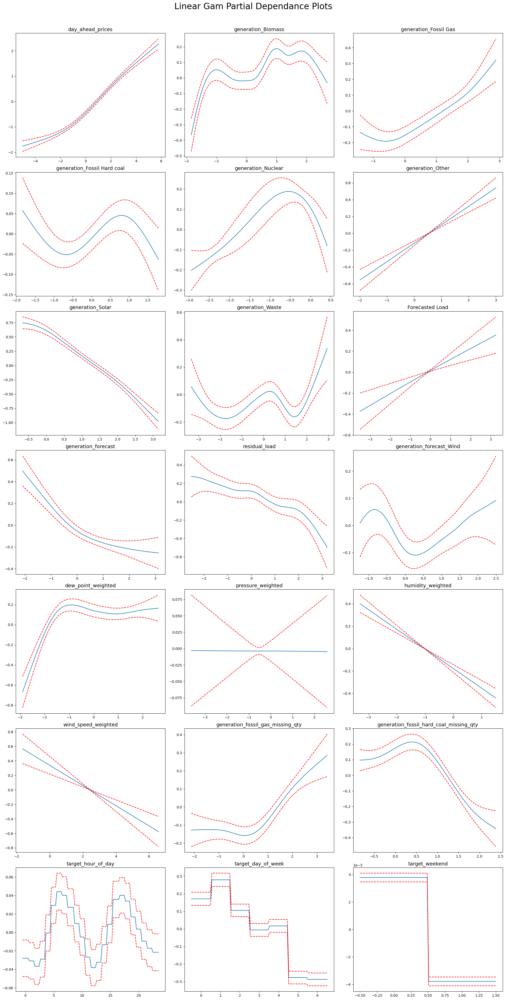

In [20]:
training_days= 200
use_grid_search = True
lamda_alpha = 2
lamda_beta = 6

temp_model_name = f"linear_gam_use_grid_search_{use_grid_search}_lamda_alpha_{lamda_alpha}_lamda_beta_{lamda_beta}_train_{training_days}d"

rwlg.plot_partial_dependence(temp_model_name, startdate_val, startdate_test, training_days, figsize=(20, 40))

## Light GBM

In [14]:
covariate_names = [col for col in df_train.columns]

cols_2_remove = ['datetime', target_name]

for col in cols_2_remove:
    covariate_names.remove(col)
    
discrete_features = [name for name in covariate_names if 'target_' in name ]
ind_discrete_features = [i for i, feature in enumerate(covariate_names) if feature in discrete_features]
    
df_y = df_train[target_name].copy()
df_X = df_train[covariate_names].copy()
df_X["noise_1"] = np.random.normal(loc=0.0, scale=1.0, size=len(df_X))
df_X["noise_2"] = np.random.normal(loc=0.0, scale=2.0, size=len(df_X))

model = LGBMRegressor(random_state=0, verbosity=-1)
model.fit(df_X.values, df_y.values, categorical_feature=ind_discrete_features)
feat_imp = pd.Series(model.feature_importances_)
feat_imp.index = df_X.columns
feat_imp = feat_imp.sort_values(ascending=False)
max_noise_imp = max(feat_imp["noise_1"], feat_imp["noise_2"])
feat_imp = feat_imp[feat_imp>max_noise_imp]
covariate_names = feat_imp[feat_imp>max_noise_imp].index.to_list()
feat_imp

day_ahead_prices_lag_120                           146
day_ahead_prices                                   145
target_month                                       109
generation_fossil_gas_missing_qty                   99
generation_fossil_gas_missing_qty_lag_120           98
pressure_weighted                                   96
generation_Biomass                                  92
pressure_weighted_lag_120                           86
generation_forecast_lag_120                         84
Forecasted Load_lag_120                             81
generation_Fossil Hard coal_lag_120                 75
target_hour_of_day                                  75
generation_forecast_Wind_lag_120                    71
generation_Biomass_lag_120                          66
imports_lag_120                                     65
target_day_of_week                                  65
dew_point_weighted                                  64
generation_Wind_lag_120                             64
generation

In [15]:
# covariate_names

['day_ahead_prices_lag_120',
 'day_ahead_prices',
 'target_month',
 'generation_fossil_gas_missing_qty',
 'generation_fossil_gas_missing_qty_lag_120',
 'pressure_weighted',
 'generation_Biomass',
 'pressure_weighted_lag_120',
 'generation_forecast_lag_120',
 'Forecasted Load_lag_120',
 'generation_Fossil Hard coal_lag_120',
 'target_hour_of_day',
 'generation_forecast_Wind_lag_120',
 'generation_Biomass_lag_120',
 'imports_lag_120',
 'target_day_of_week',
 'dew_point_weighted',
 'generation_Wind_lag_120',
 'generation_Nuclear',
 'generation_Fossil Hard coal',
 'generation_fossil_hard_coal_missing_qty',
 'generation_Fossil Gas',
 'imports',
 'dew_point_weighted_lag_120',
 'temp_weighted_lag_120',
 'generation_Wind',
 'generation_Waste',
 'humidity_weighted_lag_120',
 'generation_Fossil Gas_lag_120',
 'generation_Waste_lag_120',
 'generation_forecast_Wind',
 'generation_fossil_hard_coal_missing_qty_lag_120',
 'residual_load',
 'crossborder_flow_net_lag_120',
 'generation_Other_lag_120',


In [21]:
covariate_names = [
    'day_ahead_prices_lag_120',
    'day_ahead_prices',
    'target_month',
    'generation_fossil_gas_missing_qty',
    'generation_fossil_gas_missing_qty_lag_120',
    'pressure_weighted',
    'generation_Biomass',
#     'pressure_weighted_lag_120',
    'generation_forecast_lag_120',
    'Forecasted Load_lag_120',
    'generation_Fossil Hard coal_lag_120',
    'target_hour_of_day',
    'generation_forecast_Wind_lag_120',
    'generation_Biomass_lag_120',
    'imports_lag_120',
    'target_day_of_week',
    'dew_point_weighted',
    'generation_Wind_lag_120',
    'generation_Nuclear',
    'generation_Fossil Hard coal',
    'generation_fossil_hard_coal_missing_qty',
    'generation_Fossil Gas',
    'imports',
#     'dew_point_weighted_lag_120',
#     'temp_weighted_lag_120',
    'generation_Wind',
    'generation_Waste',
#     'humidity_weighted_lag_120',
#     'generation_Fossil Gas_lag_120',
#     'generation_Waste_lag_120',
#     'generation_forecast_Wind',
#     'generation_fossil_hard_coal_missing_qty_lag_120',
#     'residual_load',
#     'crossborder_flow_net_lag_120',
#     'generation_Other_lag_120',
#     'humidity_weighted',
#     'residual_load_lag_120',
#     'temp_weighted',
#     'generation_forecast',
#     'generation_Nuclear_lag_120',
#     'generation_total_lag_120',
#     'crossborder_flow_net',
#     'generation_forecast_Solar_lag_120',
#     'RLI_24',
#     'generation_Solar',
#     'target_is_holiday',
#     'target_weekend',
#     'Forecasted Load',
#     'generation_Other',
#     'wind_speed_weighted_lag_120',
#     'wind_speed_weighted',
#     'generation_forecast_Solar',
#     'generation_Solar_lag_120',
#     'generation_total',
#     'RLI_48',
#     'clouds_all_amsterdam_lag_120',
#     'clouds_all_amsterdam',
#     'RLI_120',
#     'target_holiday_Tweede paasdag',
#     'target_holiday_Tweede Pinksterdag',
#     'generation_nuclear_missing_qty'
]

categorical_covariate_names = [
    'target_month',
    'target_hour_of_day',
    'target_day_of_week',
    'target_weekend',
    'target_is_holiday',
    'target_holiday_Eerste Kerstdag',
    'target_holiday_Eerste Pinksterdag',
    'target_holiday_Eerste paasdag',
    'target_holiday_Hemelvaartsdag',
    'target_holiday_Nieuwjaarsdag',
    'target_holiday_Tweede Kerstdag',
    'target_holiday_Tweede paasdag',
    'target_holiday_Tweede Pinksterdag'
]


In [22]:
validation_days = len(df_val) // 24
startdate_val = df_val["datetime"].dt.date.min()
y_val = df_val[target_name].values
horizon_days_val = 1

n_splits = 10
max_evals = 200
# list_training_days = [100, 200, 400, 600, 800, len(df_train) // 24]
list_training_days = [100, 200]

param_space = {
    'num_leaves': scope.int(hp.quniform('num_leaves', 2, 10, 1)),
    'learning_rate': hp.loguniform('learning_rate', np.log(0.01), np.log(0.3)),
    'max_depth': scope.int(hp.quniform('max_depth', 2, 8, 1)),
    'subsample': hp.uniform('subsample', 0.3, 0.8),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.3, 0.8),
    'reg_alpha': hp.uniform('reg_alpha', 0.2, 1),
    'reg_lambda': hp.uniform('reg_lambda', 0.2, 1),
    'n_estimators': scope.int(hp.quniform('num_iterations', 5, 200, 1)),
    'min_data_in_leaf': scope.int(hp.quniform('min_data_in_leaf', 2, 10, 1)),
    'max_bin': scope.int(hp.quniform('max_bin', 10, 100, 5)),
    'early_stopping_round': scope.int(hp.quniform('early_stopping_round', 5, 40, 1)),
    'n_jobs': -1,
    'random_state': 0,
    'verbosity': -1,
    'objective':'regression_l1',
}


int_parameters = [
    'num_leaves',
    'max_depth',
    'n_estimators', 
    'num_iterations', 
    'min_data_in_leaf',
    'max_bin',
    'early_stopping_round',
]

# option_parameters={'objective':['regression', 'regression_l1']}
option_parameters={}

model_name = "light_gbm_hyperopt"

for temp_training_days in list_training_days:
    print("#" * 100)
    print(f"Number of training days = {temp_training_days}")
    print("\n")
 
    bo_lgbm = BayesianOptimisationLgbm(df, temp_training_days, startdate_val, validation_days, model_name, target_name,
                                       covariate_names, categorical_covariate_names, n_splits, param_space, max_evals,
                                       int_parameters, option_parameters)

    temp = bo_lgbm.get_opt_hyperparams()
    print(f"Optimal hyperparameter values:")
    print(temp)


####################################################################################################
Number of training days = 100


  1%|▎                                  | 2/200 [00:02<04:06,  1.24s/trial, best loss: 26.064653455283864]


KeyboardInterrupt: 

In [23]:
binary_covariate_names = None

validation_days = len(df_val) // 24
startdate_val = df_val["datetime"].dt.date.min()
y_val = df_val[target_name].values
horizon_days_val = 1

# test_days = len(df_test) // 24
# startdate_test = df_test["datetime"].dt.date.min()
# y_test = df_test[target_name].values
# horizon_days_test = 1

test_days = validation_days
startdate_test = startdate_val
y_test = np.array([])
horizon_days_test = horizon_days_val


save_predictions_flag = {
    'train':True,
    'val':True,
    'test':False
}

# list_training_days = [100, 200, 400, 600, 800, len(df_train) // 24]
list_training_days = [100, 200]

gap_days = 0
model_name = "light_gbm_hyperopt"

mlflow.set_experiment("/electricity-prices-lightgbm-hyperparameteropt")

for training_days in list_training_days:
    
    temp_covariate_names = deepcopy(covariate_names)
    
    if training_days < 365:
        temp_covariate_names.remove('target_month')

    rwlgbm = RollingWindowLightGBM(df, y_val, startdate_val, validation_days, horizon_days_val, y_test, startdate_test,
                                   test_days, horizon_days_test, gap_days, target_name, temp_covariate_names,
                                   binary_covariate_names, categorical_covariate_names)

    filename = f"..\\models\\hyperparams_{model_name}_{training_days}d.joblib"
    params = rwlgbm.load_model_cache(filename)

    params["n_estimators"] = params.pop('num_iterations')

    dict_models = {
        model_name: {
            'training_days': [training_days],
            'scale_data': False,
            'generate_dummy_features': False,
            'model_implementation': 'sklearn',
            'model_instance': LGBMRegressor(n_jobs=-1, random_state=0, verbosity=-1, **params),
            'model_params': {},
            'fit_params':{}
        }
    }

    _, _ = rwlgbm.train_models(dict_models, save_predictions_flag)

Loading model cache from ..\models\hyperparams_light_gbm_hyperopt_100d.joblib
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-03-30_2022-07-07.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-07-08_2022-07-08.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-03-31_2022-07-08.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-07-09_2022-07-09.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-04-01_2022-07-09.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-07-10_2022-07-10.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-04-02_2022-07-10.npy
Loading predictions from ..\prediction

Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-05-04_2022-08-11.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-08-12_2022-08-12.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-05-05_2022-08-12.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-08-13_2022-08-13.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-05-06_2022-08-13.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-08-14_2022-08-14.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-05-07_2022-08-14.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-08-15_2022-08

Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-06-20_2022-09-27.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-09-28_2022-09-28.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-06-21_2022-09-28.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-09-29_2022-09-29.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-06-22_2022-09-29.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-09-30_2022-09-30.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-06-23_2022-09-30.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-10-01_2022-10

Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-11-13_2022-11-13.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-08-06_2022-11-13.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-11-14_2022-11-14.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-08-07_2022-11-14.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-11-15_2022-11-15.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-08-08_2022-11-15.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-11-16_2022-11-16.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-08-09_2022-11

Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-12-17_2022-12-17.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-09-09_2022-12-17.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-12-18_2022-12-18.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-09-10_2022-12-18.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-12-19_2022-12-19.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-09-11_2022-12-19.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2022-12-20_2022-12-20.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-09-12_2022-12

Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2023-02-03_2023-02-03.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-10-27_2023-02-03.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2023-02-04_2023-02-04.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-10-28_2023-02-04.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2023-02-05_2023-02-05.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-10-29_2023-02-05.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2023-02-06_2023-02-06.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-10-30_2023-02

Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-12-14_2023-03-23.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2023-03-24_2023-03-24.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-12-15_2023-03-24.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2023-03-25_2023-03-25.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-12-16_2023-03-25.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2023-03-26_2023-03-26.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2022-12-17_2023-03-26.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2023-03-27_2023-03

Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2023-01-30_2023-05-09.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2023-05-10_2023-05-10.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_100d_train_period_2023-01-31_2023-05-10.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_100d_val_period_2023-05-11_2023-05-11.npy
Loading model cache from ..\models\hyperparams_light_gbm_hyperopt_200d.joblib
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2021-12-20_2022-07-07.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-07-08_2022-07-08.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2021-12-21_2022-07-08.npy
Loading predictions from ..\prediction

Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-08-09_2022-08-09.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-01-22_2022-08-09.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-08-10_2022-08-10.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-01-23_2022-08-10.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-08-11_2022-08-11.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-01-24_2022-08-11.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-08-12_2022-08-12.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-01-25_2022-08

Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-03-11_2022-09-26.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-09-27_2022-09-27.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-03-12_2022-09-27.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-09-28_2022-09-28.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-03-13_2022-09-28.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-09-29_2022-09-29.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-03-14_2022-09-29.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-09-30_2022-09

Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-04-29_2022-11-14.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-11-15_2022-11-15.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-04-30_2022-11-15.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-11-16_2022-11-16.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-05-01_2022-11-16.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-11-17_2022-11-17.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-05-02_2022-11-17.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-11-18_2022-11

Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-01-02_2023-01-02.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-06-17_2023-01-02.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-01-03_2023-01-03.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-06-18_2023-01-03.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-01-04_2023-01-04.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-06-19_2023-01-04.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-01-05_2023-01-05.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-06-20_2023-01

Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-02-05_2023-02-05.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-07-21_2023-02-05.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-02-06_2023-02-06.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-07-22_2023-02-06.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-02-07_2023-02-07.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-07-23_2023-02-07.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-02-08_2023-02-08.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-07-24_2023-02

Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-09-04_2023-03-22.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-03-23_2023-03-23.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-09-05_2023-03-23.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-03-24_2023-03-24.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-09-06_2023-03-24.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-03-25_2023-03-25.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-09-07_2023-03-25.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-03-26_2023-03

Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-10-09_2023-04-26.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-04-27_2023-04-27.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-10-10_2023-04-27.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-04-28_2023-04-28.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-10-11_2023-04-28.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-04-29_2023-04-29.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-10-12_2023-04-29.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-04-30_2023-04

In [24]:
model_name = "light_gbm_hyperopt"

plot_lgbm_train = PlotLightGBMTrainingPredictions(df_train, covariate_names, categorical_covariate_names, target_name, model_name)

In [25]:
plot_lgbm_train.generate_plot(100)

Loading model cache from ..\models\hyperparams_light_gbm_hyperopt_100d.joblib


alt.LayerChart(...)

In [26]:
plot_lgbm_train.generate_plot(200)

Loading model cache from ..\models\hyperparams_light_gbm_hyperopt_200d.joblib


alt.LayerChart(...)

In [27]:
binary_covariate_names = None

save_predictions_flag = {
    'train':True,
    'val':True,
    'test':False
}

validation_days = len(df_val) // 24
startdate_val = df_val["datetime"].dt.date.min()
y_val = df_val[target_name].values
horizon_days_val = 1

test_days = validation_days
startdate_test = startdate_val
y_test = np.array([])
horizon_days_test = horizon_days_val

training_days = 200

mlflow.set_experiment("/electricity-prices-hyperparameteropt")

model_name = "light_gbm_hyperopt"

rwlgbm = RollingWindowLightGBM(df, y_val, startdate_val, validation_days, horizon_days_val, y_test, startdate_test,
                               test_days, horizon_days_test, gap_days, target_name, covariate_names,
                               binary_covariate_names, categorical_covariate_names)

filename = f"..\\models\\hyperparams_{model_name}_{training_days}d.joblib"
params = rwlgbm.load_model_cache(filename)

params["n_estimators"] = params.pop('num_iterations')

dict_models = {
    model_name: {
        'training_days': [training_days],
        'scale_data': False,
        'generate_dummy_features': False,
        'model_implementation': 'sklearn',
        'model_instance': LGBMRegressor(n_jobs=-1, random_state=0, verbosity=-1, **params),
        'model_params': {},
        'fit_params':{}
    }
}

predictions_light_gbm, results_light_gbm = rwlgbm.train_models(dict_models, save_predictions_flag)

Loading model cache from ..\models\hyperparams_light_gbm_hyperopt_200d.joblib
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2021-12-20_2022-07-07.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-07-08_2022-07-08.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2021-12-21_2022-07-08.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-07-09_2022-07-09.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2021-12-22_2022-07-09.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2022-07-10_2022-07-10.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2021-12-23_2022-07-10.npy
Loading predictions from ..\prediction

Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-02-12_2023-02-12.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-07-28_2023-02-12.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-02-13_2023-02-13.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-07-29_2023-02-13.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-02-14_2023-02-14.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-07-30_2023-02-14.npy
Loading predictions from ..\predictions\predictions_val_light_gbm_hyperopt__train_200d_val_period_2023-02-15_2023-02-15.npy
Loading predictions from ..\predictions\predictions_train_light_gbm_hyperopt__train_200d_train_period_2022-07-31_2023-02

In [28]:
model_names_detailed = [
    'SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d',
    'lasso_alpha_0.1_train_100d',
    'ridge_alpha_5000.0_train_200d',
    'elasticnet_alpha_0.3_l1_ratio_0.5_train_100d',
    'linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d',
    'light_gbm_hyperopt__train_200d'
]

model_names = [
    'sarimax',
    'lasso',
    'ridge',
    'elasticnet',
    'linear_gam',
    'light_gbm'
]

model_predictions = [
    predictions_arima,
    predictions_linear,
    predictions_linear,
    predictions_linear,
    predictions_gam,
    predictions_light_gbm
]

predictions_val = df_val[['datetime', 'day_ahead_prices_lead_48']].copy().rename(columns={'day_ahead_prices_lead_48':'ground_truth'})

for model_name, model_name_detailed, model_pred in zip(model_names, model_names_detailed, model_predictions):
    predictions_val[model_name] = model_pred[model_name_detailed]['val']

predictions_val.to_csv("..\\predictions\\predictions_val.csv", index=False)

In [3]:
# Load the dataset
df_pred_val = pd.read_csv('..\\predictions\\predictions_val.csv')
df_pred_val['datetime'] = pd.to_datetime(df_pred_val['datetime'])
df_pred_val = df_pred_val.set_index('datetime')

plot_predictions_interactive(df_pred_val, 'Validation')

alt.LayerChart(...)

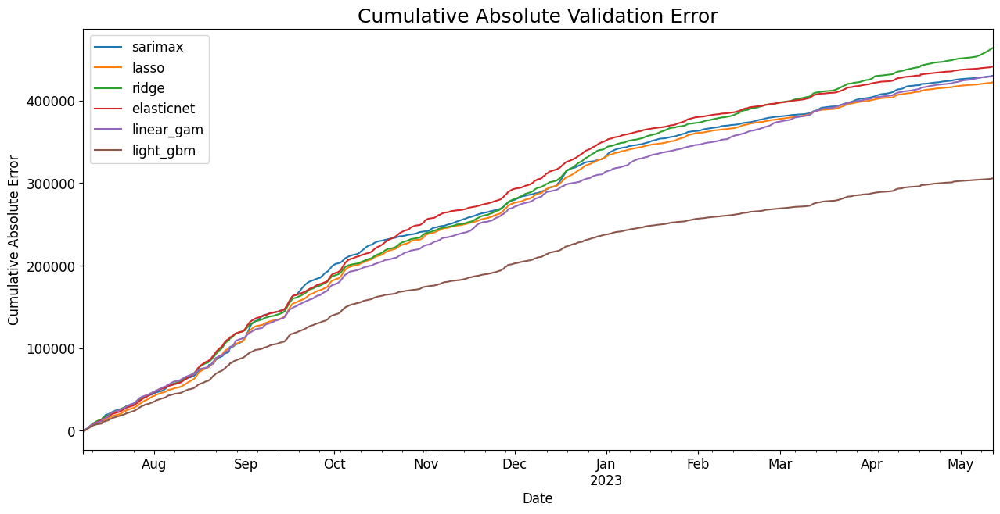

In [4]:
# Load the dataset
df_pred_val = pd.read_csv('..\\predictions\\predictions_val.csv')
df_pred_val['datetime'] = pd.to_datetime(df_pred_val['datetime'])

plot_cumulative_absolute_error(df_pred_val, 'Validation')

# Test Predictions

## Naive

In [32]:
test_days = len(df_test) // 24
startdate_test = df_test["datetime"].dt.date.min()
y_test = df_test[target_name].values
horizon_days_test = test_days
covariate_names = []

validation_days = len(df_test) // 24
startdate_val = df_test["datetime"].dt.date.min()
y_val = np.array([])
horizon_days_val = test_days

gap_days = 0

dict_models = {
    'naive': {
        'training_days':[training_days],
        'scale_data':False,
        'model_implementation':'sklearn',
        'model_params':{
            'lookback_horizon_days':[2,7]
        },
        'fit_params':{}
    }
}

save_predictions_flag = {
    'train':False,
    'val':False,
    'test':True
}

mlflow.set_experiment("/electricity-prices-test")

rwn = RollingWindowNaive(df, y_val, startdate_val, validation_days, horizon_days_val, y_test, startdate_test,
                         test_days, horizon_days_test, gap_days,target_name, covariate_names)

test_predictions_naive, test_results_naive =  rwn.train_models(dict_models, save_predictions_flag)

Saving ..\predictions\predictions_test_naive_lookback_horizon_days_2_train_200d_test_period_2023-05-19_2024-03-21.npy
Saving ..\predictions\predictions_test_naive_lookback_horizon_days_7_train_200d_test_period_2023-05-19_2024-03-21.npy


## ARIMA

In [33]:
test_days = len(df_test) // 24
startdate_test = df_test["datetime"].dt.date.min()
y_test = df_test[target_name].values
horizon_days_test = 1

validation_days = test_days
startdate_val = startdate_test - timedelta(days=1)
y_val = np.array([])
horizon_days_val = horizon_days_test

gap_days = 0

covariate_names = None
binary_covariate_names = None
categorical_covariate_names = None
target_name_arima = 'day_ahead_prices'

dict_models = {
    'SARIMAX': {
        'training_days':[200],
        'lead_days':2,
        'scale_data':False,
        'generate_dummy_features':False,
        'model_implementation':'statsmodels',
        'model_params':{
            'order':[(1, 1, 1)],
            'seasonal_order':[(1, 0, 1, 24)]
        },
        'fit_params':{}
    }
}

save_predictions_flag = {
    'train':False,
    'val':False,
    'test':True
}

mlflow.set_experiment("/electricity-prices-test")

rws = RollingWindowSarimax(df, y_val, startdate_val, validation_days, horizon_days_val, y_test, startdate_test,
                            test_days, horizon_days_test, gap_days, target_name_arima, covariate_names,
                            binary_covariate_names, categorical_covariate_names)

predictions_test_arima, results_test_arima = rws.train_models(dict_models, save_predictions_flag)

Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-05-19_2023-05-19.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-05-20_2023-05-20.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-05-21_2023-05-21.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-05-22_2023-05-22.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-05-23_2023-05-23.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-05-24_2023-05-24.npy
Loading predictions from ..\predictions\predic

Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-07-18_2023-07-18.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-07-19_2023-07-19.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-07-20_2023-07-20.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-07-21_2023-07-21.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-07-22_2023-07-22.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-07-23_2023-07-23.npy
Loading predictions from ..\predictions\predic

Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-09-16_2023-09-16.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-09-17_2023-09-17.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-09-18_2023-09-18.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-09-19_2023-09-19.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-09-20_2023-09-20.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-09-21_2023-09-21.npy
Loading predictions from ..\predictions\predic

Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-11-18_2023-11-18.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-11-19_2023-11-19.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-11-20_2023-11-20.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-11-21_2023-11-21.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-11-22_2023-11-22.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2023-11-23_2023-11-23.npy
Loading predictions from ..\predictions\predic

Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2024-01-23_2024-01-23.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2024-01-24_2024-01-24.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2024-01-25_2024-01-25.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2024-01-26_2024-01-26.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2024-01-27_2024-01-27.npy
Loading predictions from ..\predictions\predictions_test_SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d_test_period_2024-01-28_2024-01-28.npy
Loading predictions from ..\predictions\predic

## Linear Models

In [34]:
test_days = len(df_test) // 24
startdate_test = df_test["datetime"].dt.date.min()
y_test = df_test[target_name].values
horizon_days_test = 1

validation_days = len(df_test) // 24
startdate_val = startdate_test - timedelta(days=1)
y_val = np.array([])
horizon_days_val = 1

gap_days = 0

covariate_names = [col for col in df_train.columns]

for names in ['datetime', target_name]:
    covariate_names.remove(names)
    
binary_covariate_names = [
    'target_weekend',
    'target_is_holiday',
    'target_holiday_Eerste Kerstdag',
    'target_holiday_Eerste Pinksterdag',
    'target_holiday_Eerste paasdag',
    'target_holiday_Hemelvaartsdag',
    'target_holiday_Nieuwjaarsdag',
    'target_holiday_Tweede Kerstdag',
    'target_holiday_Tweede paasdag',
    'target_holiday_Tweede Pinksterdag',
]
categorical_covariate_names = [
    'target_hour_of_day',
    'target_day_of_week',
    'target_month'
]

rwlms = RollingWindowSklearn(df, y_val, startdate_val, validation_days, horizon_days_val, y_test, startdate_test,
                             test_days, horizon_days_test, gap_days, target_name, covariate_names,
                             binary_covariate_names, categorical_covariate_names)

dict_models = {
    'lasso': {
        'training_days':[100],
        'scale_data':True,
        'generate_dummy_features':True,
        'model_implementation':'sklearn',
        'model_instance': Lasso(random_state=0),
        'model_params':{
            'alpha':[0.1]
        },
        'fit_params':{}
    },
    'ridge': {
        'training_days':[200],
        'scale_data':True,
        'generate_dummy_features':True,
        'model_implementation':'sklearn',
        'model_instance': Ridge(random_state=0),
        'model_params':{
            'alpha':[5000.0]
        },
        'fit_params':{}
    },
    'elasticnet': {
        'training_days':[100],
        'scale_data':True,
        'generate_dummy_features':True,
        'model_implementation':'sklearn',
        'model_instance': ElasticNet(random_state=0),
        'model_params':{
            'alpha':[0.3],
            'l1_ratio':[0.5]
        },
        'fit_params':{}
    },    
}

save_predictions_flag = {
    'train':False,
    'val':False,
    'test':True
}


mlflow.set_experiment("/electricity-prices-test")
predictions_test_linear, results_test_linear = rwlms.train_models(dict_models, save_predictions_flag)

Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-05-19_2023-05-19.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-05-20_2023-05-20.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-05-21_2023-05-21.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-05-22_2023-05-22.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-05-23_2023-05-23.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-05-24_2023-05-24.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-05-25_2023-05-25.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-05-26_2023-05-26.npy
Loading predictions from

Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-08-18_2023-08-18.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-08-19_2023-08-19.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-08-20_2023-08-20.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-08-21_2023-08-21.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-08-22_2023-08-22.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-08-23_2023-08-23.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-08-24_2023-08-24.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-08-25_2023-08-25.npy
Loading predictions from

Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-10-25_2023-10-25.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-10-26_2023-10-26.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-10-27_2023-10-27.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-10-28_2023-10-28.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-10-29_2023-10-29.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-10-30_2023-10-30.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-10-31_2023-10-31.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2023-11-01_2023-11-01.npy
Loading predictions from

Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-01-03_2024-01-03.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-01-04_2024-01-04.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-01-05_2024-01-05.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-01-06_2024-01-06.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-01-07_2024-01-07.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-01-08_2024-01-08.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-01-09_2024-01-09.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-01-10_2024-01-10.npy
Loading predictions from

Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-03-11_2024-03-11.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-03-12_2024-03-12.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-03-13_2024-03-13.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-03-14_2024-03-14.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-03-15_2024-03-15.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-03-16_2024-03-16.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-03-17_2024-03-17.npy
Loading predictions from ..\predictions\predictions_test_lasso_alpha_0.1_train_100d_test_period_2024-03-18_2024-03-18.npy
Loading predictions from

Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-07-28_2023-07-28.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-07-29_2023-07-29.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-07-30_2023-07-30.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-07-31_2023-07-31.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-08-01_2023-08-01.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-08-02_2023-08-02.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-08-03_2023-08-03.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-08-04_2023-08-04.npy


Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-10-15_2023-10-15.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-10-16_2023-10-16.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-10-17_2023-10-17.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-10-18_2023-10-18.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-10-19_2023-10-19.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-10-20_2023-10-20.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-10-21_2023-10-21.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2023-10-22_2023-10-22.npy


Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2024-01-20_2024-01-20.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2024-01-21_2024-01-21.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2024-01-22_2024-01-22.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2024-01-23_2024-01-23.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2024-01-24_2024-01-24.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2024-01-25_2024-01-25.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2024-01-26_2024-01-26.npy
Loading predictions from ..\predictions\predictions_test_ridge_alpha_5000.0_train_200d_test_period_2024-01-27_2024-01-27.npy


Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-06-15_2023-06-15.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-06-16_2023-06-16.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-06-17_2023-06-17.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-06-18_2023-06-18.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-06-19_2023-06-19.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-06-20_2023-06-20.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-06-21_2023-06-21.npy
Loading predictions 

Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-08-15_2023-08-15.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-08-16_2023-08-16.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-08-17_2023-08-17.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-08-18_2023-08-18.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-08-19_2023-08-19.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-08-20_2023-08-20.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-08-21_2023-08-21.npy
Loading predictions 

Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-11-06_2023-11-06.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-11-07_2023-11-07.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-11-08_2023-11-08.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-11-09_2023-11-09.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-11-10_2023-11-10.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-11-11_2023-11-11.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2023-11-12_2023-11-12.npy
Loading predictions 

Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2024-01-08_2024-01-08.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2024-01-09_2024-01-09.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2024-01-10_2024-01-10.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2024-01-11_2024-01-11.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2024-01-12_2024-01-12.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2024-01-13_2024-01-13.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2024-01-14_2024-01-14.npy
Loading predictions 

Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2024-03-14_2024-03-14.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2024-03-15_2024-03-15.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2024-03-16_2024-03-16.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2024-03-17_2024-03-17.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2024-03-18_2024-03-18.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2024-03-19_2024-03-19.npy
Loading predictions from ..\predictions\predictions_test_elasticnet_alpha_0.3_l1_ratio_0.5_train_100d_test_period_2024-03-20_2024-03-20.npy
Loading predictions 

## GAM

In [35]:
test_days = len(df_test) // 24
startdate_test = df_test["datetime"].dt.date.min()
y_test = df_test[target_name].values
horizon_days_test = 1

validation_days = len(df_test) // 24
startdate_val = startdate_test - timedelta(days=1)
y_val = np.array([])
horizon_days_val = 1

gap_days = 0

covariate_names = [
    'day_ahead_prices',
    'generation_Biomass',
    'generation_Fossil Gas',
    'generation_Fossil Hard coal',
    'generation_Nuclear',
    'generation_Other',
    'generation_Solar',
    'generation_Waste',
    'crossborder_flow_net',
    'imports',
    'Forecasted Load',
    'generation_forecast',
    'generation_forecast_Solar',
    'generation_total',
    'residual_load',
    'generation_Wind',
    'generation_forecast_Wind',
    'clouds_all_amsterdam',
    'dew_point_weighted',
    'temp_weighted',
    'pressure_weighted',
    'humidity_weighted',
    'wind_speed_weighted',
    'generation_fossil_gas_missing_qty',
    'generation_fossil_hard_coal_missing_qty',
    'generation_nuclear_missing_qty',
    'target_hour_of_day',
    'target_day_of_week',
    'target_weekend',
    'RLI_24',
    'RLI_48',
    'RLI_120'
]



binary_covariate_names = None
categorical_covariate_names = [col for col in covariate_names if 'target_' in col]
tensor_term_names = None
list_alphas = [2]
list_betas = [6]
params = [list_alphas, list_betas]
params = list(product(*params))
gap_days = 0

dict_models = {
    'linear_gam': {
        'training_days':[200],
        'scale_data':True,
        'generate_dummy_features':False,
        'model_implementation':'sklearn',
        'print_summary':False,
        'n_parameter_trials':100,
        'model_params':{
            'use_grid_search':[True],
            'lamda_alpha':list_alphas,
            'lamda_beta':list_betas
        },
        'fit_params':{}
    }
}

save_predictions_flag = {
    'train':False,
    'val':False,
    'test':True
}

rwlg = RollingWindowLinearGam(df, y_val, startdate_val, validation_days, horizon_days_val, y_test, startdate_test,
                              test_days, horizon_days_test, gap_days, target_name, covariate_names,
                              binary_covariate_names, categorical_covariate_names, tensor_term_names)

mlflow.set_experiment("/electricity-prices-test")
predictions_test_gam, results_test_gam = rwlg.train_models(dict_models, save_predictions_flag)

Loading model cache from ..\models\model_cache_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-10-30_2023-05-17.joblib
Saving model cache to ..\models\model_cache_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-10-30_2023-05-17.joblib
Loading model cache from ..\models\model_cache_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_train_period_2022-10-30_2023-05-17.joblib
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-05-19_2023-05-19.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-05-20_2023-05-20.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-05-21_2023-05-21.npy
Loading predictions from ..\pre

Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-07-21_2023-07-21.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-07-22_2023-07-22.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-07-23_2023-07-23.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-07-24_2023-07-24.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-07-25_2023-07-25.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-07-26_2023-07-26.npy
Loading pr

Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-09-19_2023-09-19.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-09-20_2023-09-20.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-09-21_2023-09-21.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-09-22_2023-09-22.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-09-23_2023-09-23.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-09-24_2023-09-24.npy
Loading pr

Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-11-19_2023-11-19.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-11-20_2023-11-20.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-11-21_2023-11-21.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-11-22_2023-11-22.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-11-23_2023-11-23.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2023-11-24_2023-11-24.npy
Loading pr

Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2024-01-22_2024-01-22.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2024-01-23_2024-01-23.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2024-01-24_2024-01-24.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2024-01-25_2024-01-25.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2024-01-26_2024-01-26.npy
Loading predictions from ..\predictions\predictions_test_linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d_test_period_2024-01-27_2024-01-27.npy
Loading pr

## Light GBM

In [38]:
test_days = len(df_test) // 24
startdate_test = df_test["datetime"].dt.date.min()
y_test = df_test[target_name].values
horizon_days_test = 1

validation_days = len(df_test) // 24
startdate_val = startdate_test - timedelta(days=1)
y_val = np.array([])
horizon_days_val = 1

gap_days = 0

covariate_names = [
    'day_ahead_prices_lag_120',
    'day_ahead_prices',
    'target_month',
    'generation_fossil_gas_missing_qty',
    'generation_fossil_gas_missing_qty_lag_120',
    'pressure_weighted',
    'generation_Biomass',
    'generation_forecast_lag_120',
    'Forecasted Load_lag_120',
    'generation_Fossil Hard coal_lag_120',
    'target_hour_of_day',
    'generation_forecast_Wind_lag_120',
    'generation_Biomass_lag_120',
    'imports_lag_120',
    'target_day_of_week',
    'dew_point_weighted',
    'generation_Wind_lag_120',
    'generation_Nuclear',
    'generation_Fossil Hard coal',
    'generation_fossil_hard_coal_missing_qty',
    'generation_Fossil Gas',
    'imports',
    'generation_Wind',
    'generation_Waste',
]

categorical_covariate_names = [
    'target_month',
    'target_hour_of_day',
    'target_day_of_week',
    'target_weekend',
    'target_is_holiday',
    'target_holiday_Eerste Kerstdag',
    'target_holiday_Eerste Pinksterdag',
    'target_holiday_Eerste paasdag',
    'target_holiday_Hemelvaartsdag',
    'target_holiday_Nieuwjaarsdag',
    'target_holiday_Tweede Kerstdag',
    'target_holiday_Tweede paasdag',
    'target_holiday_Tweede Pinksterdag'
]


binary_covariate_names = None

training_days = 200

mlflow.set_experiment("/electricity-prices-test")

model_name = "light_gbm_hyperopt"
    
rwlgbm = RollingWindowLightGBM(df, y_val, startdate_val, validation_days, horizon_days_val, y_test, startdate_test,
                               test_days, horizon_days_test, gap_days, target_name, covariate_names,
                               binary_covariate_names, categorical_covariate_names)

filename = f"..\\models\\hyperparams_{model_name}_{training_days}d.joblib"
params = rwlgbm.load_model_cache(filename)

params["n_estimators"] = params.pop('num_iterations')

dict_models = {
    model_name: {
        'training_days': [training_days],
        'scale_data': False,
        'generate_dummy_features': False,
        'model_implementation': 'sklearn',
        'model_instance': LGBMRegressor(n_jobs=-1, random_state=0, verbosity=-1, **params),
        'model_params': {},
        'fit_params':{}
    }
}

save_predictions_flag = {
    'train':False,
    'val':False,
    'test':True
}

predictions_test_light_gbm, results_test_light_gbm = rwlgbm.train_models(dict_models, save_predictions_flag)

Loading model cache from ..\models\hyperparams_light_gbm_hyperopt_200d.joblib
Loading predictions from ..\predictions\predictions_test_light_gbm_hyperopt__train_200d_test_period_2023-05-19_2023-05-19.npy
Loading predictions from ..\predictions\predictions_test_light_gbm_hyperopt__train_200d_test_period_2023-05-20_2023-05-20.npy
Loading predictions from ..\predictions\predictions_test_light_gbm_hyperopt__train_200d_test_period_2023-05-21_2023-05-21.npy
Loading predictions from ..\predictions\predictions_test_light_gbm_hyperopt__train_200d_test_period_2023-05-22_2023-05-22.npy
Loading predictions from ..\predictions\predictions_test_light_gbm_hyperopt__train_200d_test_period_2023-05-23_2023-05-23.npy
Loading predictions from ..\predictions\predictions_test_light_gbm_hyperopt__train_200d_test_period_2023-05-24_2023-05-24.npy
Loading predictions from ..\predictions\predictions_test_light_gbm_hyperopt__train_200d_test_period_2023-05-25_2023-05-25.npy
Loading predictions from ..\predictions\

In [40]:
model_names_detailed = [
    'SARIMAX_order_(1, 1, 1)_seasonal_order_(1, 0, 1, 24)_train_200d',
    'lasso_alpha_0.1_train_100d',
    'ridge_alpha_5000.0_train_200d',
    'elasticnet_alpha_0.3_l1_ratio_0.5_train_100d',
    'linear_gam_use_grid_search_True_lamda_alpha_2_lamda_beta_6_train_200d',
    'light_gbm_hyperopt__train_200d'
]

model_names = [
    'sarimax',
    'lasso',
    'ridge',
    'elasticnet',
    'linear_gam',
    'light_gbm'
]

model_test_predictions = [
    predictions_test_arima,
    predictions_test_linear,
    predictions_test_linear,
    predictions_test_linear,
    predictions_test_gam,
    predictions_test_light_gbm
]

predictions_test = df_test[['datetime', 'day_ahead_prices_lead_48']].copy().rename(columns={'day_ahead_prices_lead_48':'ground_truth'})

for model_name, model_name_detailed, model_pred in zip(model_names, model_names_detailed, model_test_predictions):
    predictions_test[model_name] = model_pred[model_name_detailed]['test']
    
predictions_test.to_csv("..\\predictions\\predictions_test.csv", index=False)

In [2]:
# Load the dataset
df_pred_test = pd.read_csv('..\\predictions\\predictions_test.csv')
df_pred_test['datetime'] = pd.to_datetime(df_pred_test['datetime'])
df_pred_test = df_pred_test.set_index('datetime')

plot_predictions_interactive(df_pred_test, 'Test')

alt.LayerChart(...)

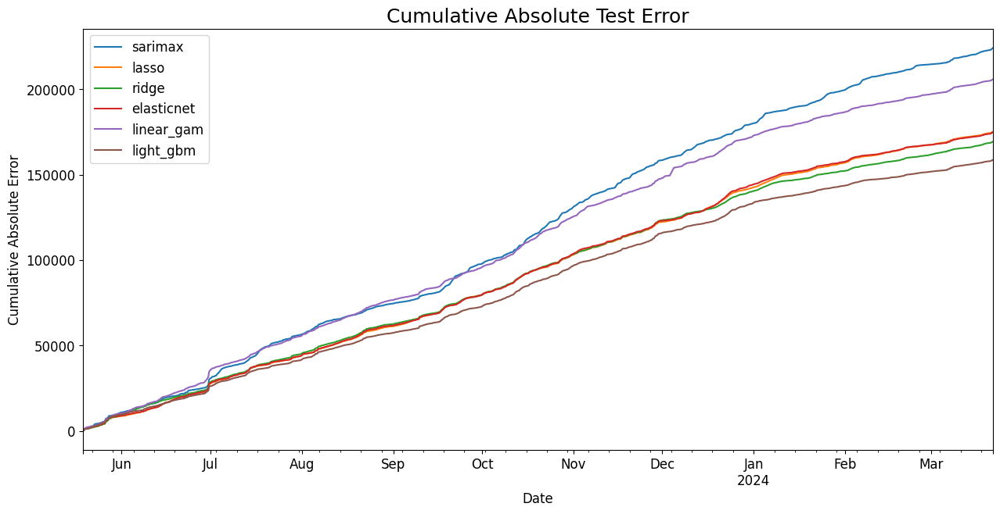

In [4]:
# Load the dataset
df_pred_test = pd.read_csv('..\\predictions\\predictions_test.csv')
df_pred_test['datetime'] = pd.to_datetime(df_pred_test['datetime'])

plot_cumulative_absolute_error(df_pred_test, 'Test')